# Detecting Abnormal ECGs

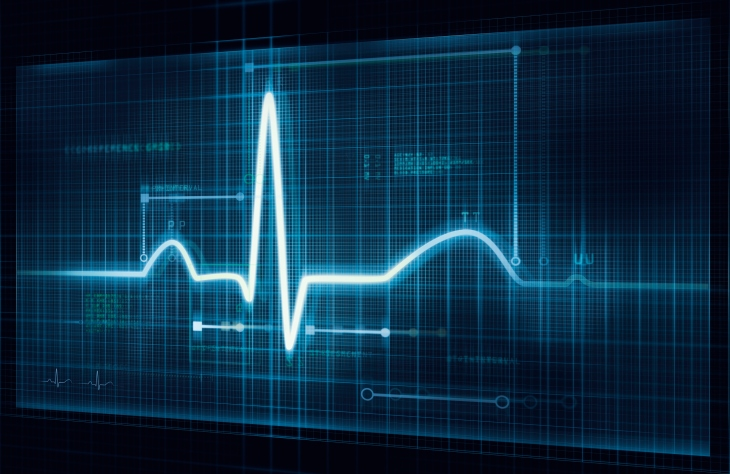

## Introduction and Business Problem

Doctors are in short supply worldwide.  Some areas, such as in central Africa and western and central Asia, have less than 1 medical doctor per 1,000 people (2018 data from the World Bank.)  [Medic Mobile](https://medic.org/) has contracted my company, J. Wayne Enterprises, to research and develop a viable "proof of concept" model that can identify and tag anomalous electrocardiographs from a dataset that contains normal and abnormal ECGs.  Medic Mobile is a nonprofit organization that strives to improve health care for those living in hard-to-reach communities.  Medic Mobile now impacts 14 countries in Africa and Asia, having trained and equipped 24,463 health workers.

The electrocardiograph (ECG) is a universally accepted diagnostic tool for physicians to analyze heartbeats.  Since its invention in 1902 by Dutch physician Willem Einthoven, it ushered in "a new era in which various machines and technical procedures gradually replaced the physician's unaided senses and the stethoscope as the primary tools of cardiac diagnosis." [ (source)](https://pubmed.ncbi.nlm.nih.gov/8184849/#:~:text=The%20invention%20of%20the%20electrocardiograph,arrhythmias%20and%20acute%20myocardial%20infarction.). Without doubt, the identification of heart anomalies through ECG's is an essential activity, and the use of machine learning models to aid physicians in this task would prove quite useful.

### Imports

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import seaborn as sns
import random
from tensorflow.keras.optimizers import Adam
from pylab import rcParams
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow import keras
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model

%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set(style="darkgrid", palette='muted', font_scale=1.2)
whimsy_pallette = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]
sns.set_palette(sns.color_palette(whimsy_pallette))
rcParams['figure.figsize'] = 12, 8

### The Dataset

From [timeseriesclassification.com...](http://www.timeseriesclassification.com/description.php?Dataset=ECG5000) "The original dataset for "ECG5000" is a 20-hour long ECG downloaded from Physionet. The name is BIDMC Congestive Heart Failure Database(chfdb) and it is record "chf07". It was originally published in "Goldberger AL, Amaral LAN, Glass L, Hausdorff JM, Ivanov PCh, Mark RG, Mietus JE, Moody GB, Peng C-K, Stanley HE. PhysioBank, PhysioToolkit, and PhysioNet: Components of a New Research Resource for Complex Physiologic Signals. Circulation 101(23)". The data was pre-processed in two steps: (1) extract each heartbeat, (2) make each heartbeat equal length using interpolation. This dataset was originally used in paper "A general framework for never-ending learning from time series streams", DAMI 29(6). After that, nearly 5,000 heartbeats were randomly selected. The patient has severe congestive heart failure and the class values were obtained by automated annotation." The dataset is stationary, and each heartbeat consists of 140 datapoints, each representing a reading measured in millivolts (mV).

We'll be training the model on the normal heartbeats, so the preparation of the data will reflect that as an end.

With nearly 5,000 samples, this is a small dataset, and it's only from a single individual, so we can already feel pretty certain that we'll be recommending the collection of more ECGs, regardless of what our models show.  Let's dive in!

In [2]:
data_path = 'data/ecg.csv'
df = pd.read_csv(data_path, header=None)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,131,132,133,134,135,136,137,138,139,140
0,-0.112522,-2.827204,-3.773897,-4.349751,-4.376041,-3.474986,-2.181408,-1.818286,-1.250522,-0.477492,...,0.792168,0.933541,0.796958,0.578621,0.257740,0.228077,0.123431,0.925286,0.193137,1.0
1,-1.100878,-3.996840,-4.285843,-4.506579,-4.022377,-3.234368,-1.566126,-0.992258,-0.754680,0.042321,...,0.538356,0.656881,0.787490,0.724046,0.555784,0.476333,0.773820,1.119621,-1.436250,1.0
2,-0.567088,-2.593450,-3.874230,-4.584095,-4.187449,-3.151462,-1.742940,-1.490659,-1.183580,-0.394229,...,0.886073,0.531452,0.311377,-0.021919,-0.713683,-0.532197,0.321097,0.904227,-0.421797,1.0
3,0.490473,-1.914407,-3.616364,-4.318823,-4.268016,-3.881110,-2.993280,-1.671131,-1.333884,-0.965629,...,0.350816,0.499111,0.600345,0.842069,0.952074,0.990133,1.086798,1.403011,-0.383564,1.0
4,0.800232,-0.874252,-2.384761,-3.973292,-4.338224,-3.802422,-2.534510,-1.783423,-1.594450,-0.753199,...,1.148884,0.958434,1.059025,1.371682,1.277392,0.960304,0.971020,1.614392,1.421456,1.0


You can see by scrolling to the last column that it contains the labels - 0 is an anomalous heartbeat, 1 is a normal heartbeat.

In [3]:
df.shape

(4998, 141)

In [4]:
df[140].value_counts()

1.0    2919
0.0    2079
Name: 140, dtype: int64

The dataset is slightly imbalanced toward normal heartbeats, but since we're training on the normal heartbeats, that's not so bad.

### Drop target from data; create target df with labels

In [5]:
raw_data = df.values

# The last element contains the labels
target = raw_data[:, -1]

# The other data points are the electrocadriogram data
features = raw_data[:, 0:-1]

### Train Test Split

In [6]:
x_train, x_test, y_train, y_test = train_test_split(
    features, target, test_size=0.2, random_state=1961,
)

### Scale the input as tensor arrays

In [7]:
min_val = tf.reduce_min(x_train)
max_val = tf.reduce_max(x_train)

x_train = (x_train - min_val) / (max_val - min_val)
x_test = (x_test - min_val) / (max_val - min_val)

x_train = tf.cast(x_train, tf.float32)
x_test = tf.cast(x_test, tf.float32)

2022-06-03 21:52:16.530567: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Separate the normal and anomalous ECGs

In [8]:
y_train = y_train.astype(bool)
y_test = y_test.astype(bool)

x_norm_train = x_train[y_train]
x_norm_test = x_test[y_test]

x_abnorm_train = x_train[~y_train]
x_abnorm_test = x_test[~y_test]

### Plot a normal ECG and abnormal ECG
Although this is definitely recognizable as an electrocardiogram, it does not completely match visually to what we are used to seeing - the orginal data was time normalized by Physionet and then we scaled it.  That doesn't affect the model's ability to evaluate it, though, because all the data has been modified in a consistent fashion.

In [9]:
# For tableau
norm = np.arange(140), x_norm_train[0]
normdf = pd.DataFrame(x_norm_train[0])
normdf.to_csv("data/tableau_csv/norm_hb.csv")

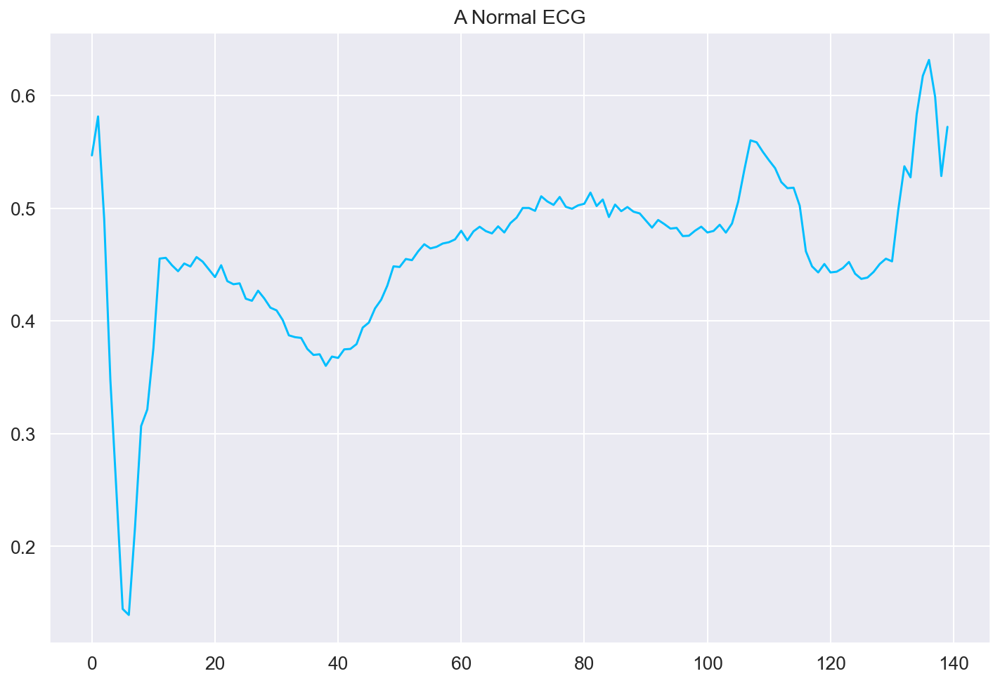

In [10]:
# 1st ECG in the normal set
plt.plot(np.arange(140), x_norm_train[0])
plt.title("A Normal ECG")
plt.savefig('images/normal_ecg.png', dpi=300, pad_inches=0.1,)
plt.show()

In [11]:
# For tableau
abnorm = np.arange(140), x_abnorm_train[0]
abnormdf = pd.DataFrame(x_abnorm_train[0])
abnormdf.to_csv("data/tableau_csv/abnorm_hb.csv")

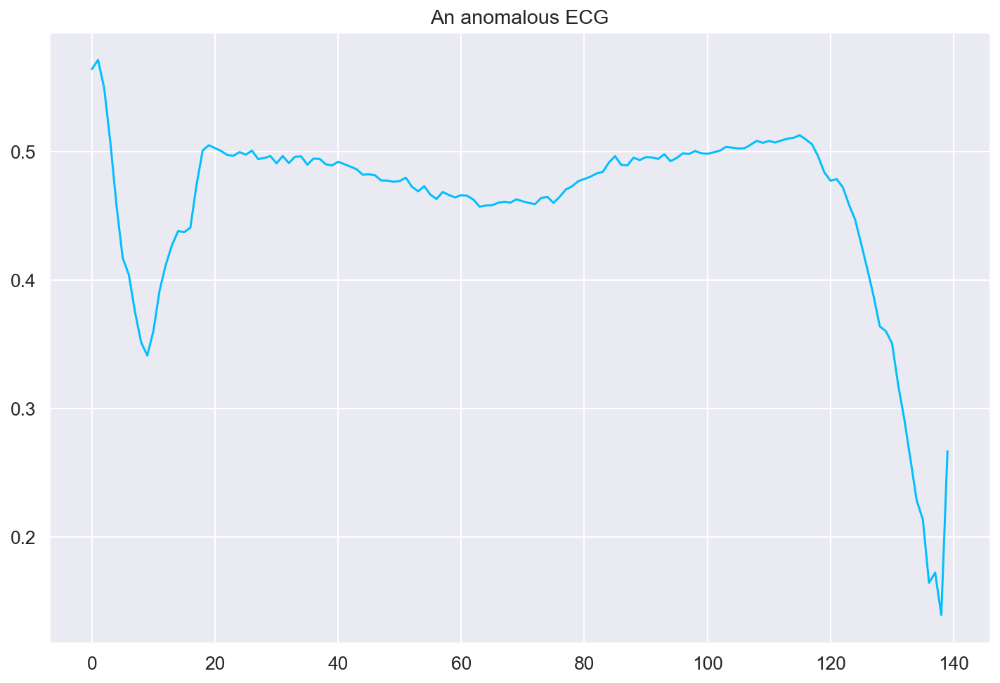

In [12]:
# 1st ECG in the abnormal set
plt.plot(np.arange(140), x_abnorm_train[0])
plt.title("An anomalous ECG")
plt.savefig('images/anomalous_ecg.png', dpi=300, pad_inches=0.1,)
plt.show()

## Time for Modeling...

## What is an autoencoder?
    
An autoencoder is an unsupervised artificial neural network that attempts to encode the data by compressing it into lower dimensions and the decode the data to reconstruct the original input.  The idea is that the reconstructed data would be as close as possible to the original.  The compressed representation of the input data is called the bottleneck layer.  The number of hidden units in the code is called the code size.  Autoencoders have several uses, one of which is for our purpose, anomaly detection.  Here's a simple diagram:

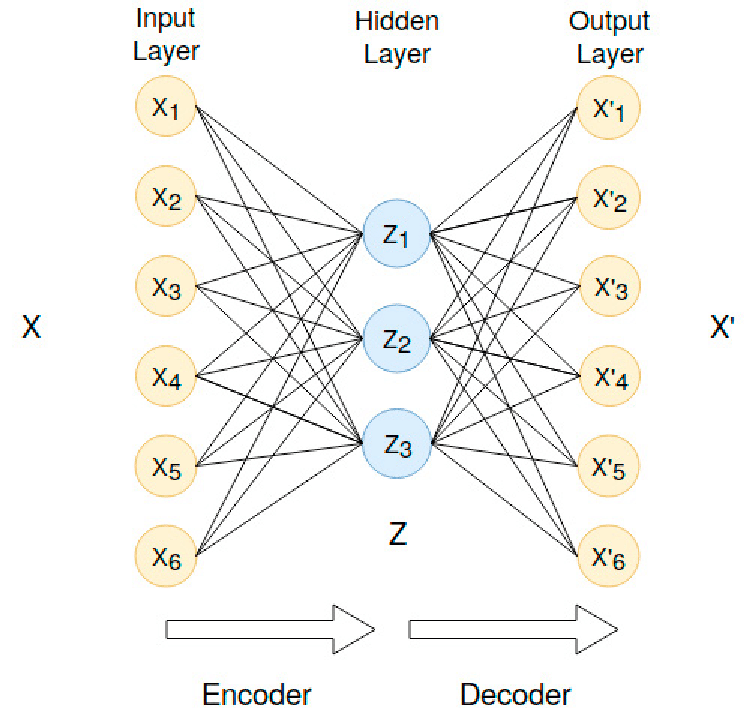



The code size, which is the size of the bottleneck, is the most important hyperperameter.  A small bottleneck lowers the risk of overfittings, but if it's too small,there is an increased chance of important information slipping out through the pooling layers of the encoder.

Autoencoding is essentially a non-linear version of Principal Component Analysis (PCA).  In fact, if you don't define any activations, and set the cost function to mean squared error (MSE), the autoencoder ends up performing PCA.  The initial model below does exactly this:

## 1.  Base Model - PCA using an Neural Network Autoencoder

### Define the model

In [101]:
encoder = Sequential([
      Dense(3),      
      Dense(2),     
    ])
decoder = Sequential([
      Dense(3),     
      Dense(x_norm_train.shape[1])
    ])

### Complile and fit the model

In [102]:
base_model = keras.models.Sequential([encoder, decoder])
base_model.compile(loss='mse', optimizer='adam')

In [103]:
history = base_model.fit(
    x_norm_train,
    x_norm_train,
    epochs=15,
    batch_size=512,
    validation_data=(x_test, x_test)
)

Epoch 1/15
5/5 [==============================] - 0s 23ms/step - loss: 0.2161 - val_loss: 0.2102
Epoch 2/15
5/5 [==============================] - 0s 5ms/step - loss: 0.2077 - val_loss: 0.2021
Epoch 3/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1992 - val_loss: 0.1927
Epoch 4/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1899 - val_loss: 0.1823
Epoch 5/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1792 - val_loss: 0.1706
Epoch 6/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1671 - val_loss: 0.1577
Epoch 7/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1542 - val_loss: 0.1443
Epoch 8/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1409 - val_loss: 0.1310
Epoch 9/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1278 - val_loss: 0.1182
Epoch 10/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1151 - val_loss: 0.1059
Epoch 11/15
5/5 [=====================

In [104]:
base_model.summary()

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_17 (Sequential)  (None, 2)                 431       
                                                                 
 sequential_18 (Sequential)  (None, 140)               569       
                                                                 
Total params: 1,000
Trainable params: 1,000
Non-trainable params: 0
_________________________________________________________________


### Save the model

In [105]:
base_model.save("models/base_model")

INFO:tensorflow:Assets written to: models/base_model/assets


### Training vs. Validation loss per epoch

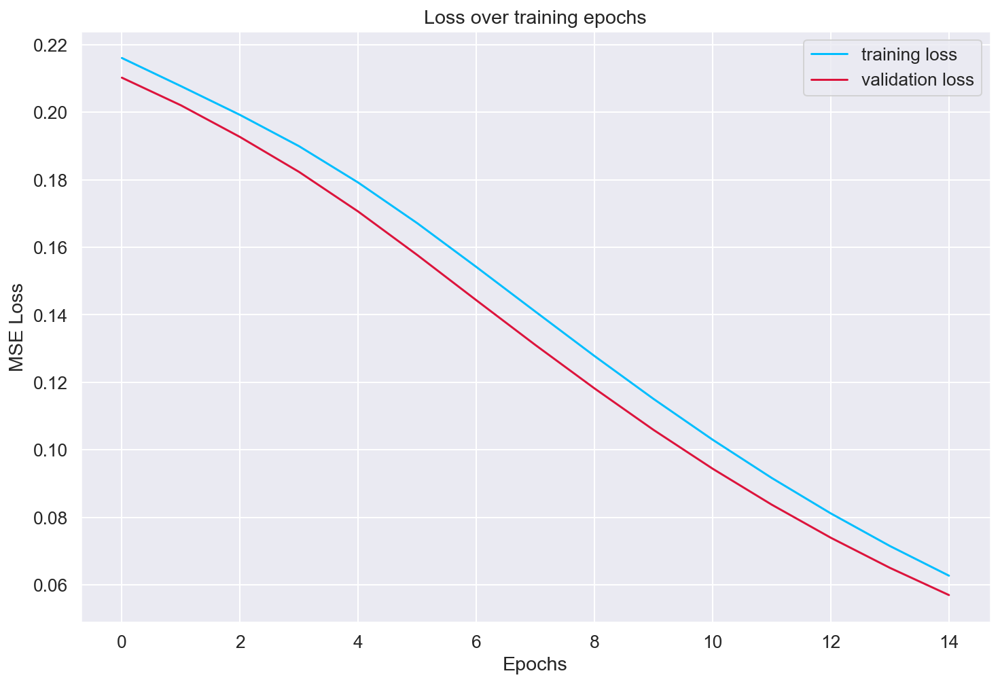

In [106]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],color='crimson')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Loss over training epochs')
plt.legend(['training loss', 'validation loss'])
plt.show();

### Input vs Reconstruction for a Normal ECG

In [107]:
def plot_ecg(title, df, save_file_name):
    
    encoded_imgs = encoder(df).numpy()
    decoded_imgs = decoder(encoded_imgs).numpy()
    
    a = 5  # number of rows
    b = 2  # number of columns
    c = 1  # initialize plot counter
    
    fig = plt.figure(figsize=(22,30))
    fig.tight_layout()
    
    for i in range(0,10):
        x = np.random.randint(low=0, high=(len(df)-1))
        plt.subplot(a, b, c)
        plt.plot(df[x],'darkblue',)
        plt.plot(decoded_imgs[x],'crimson')
        plt.fill_between(np.arange(140), decoded_imgs[x], df[x], color='#F9E79F' )
        plt.title(f'ECG #{x+1}')
        plt.legend(labels=["Input", "Reconstruction", "Error"])
        c = c + 1
    
    plt.suptitle(title, 
             x=(50-(len(title)/4))/100, y=.92, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
    org = pd.DataFrame(df[x])
    org.to_csv('data/tableau_csv/'+save_file_name[7:-1]+'_org.csv')
    recon = pd.DataFrame(decoded_imgs[x])
    recon.to_csv('data/tableau_csv/'+save_file_name[7:-1]+'_recon.csv')
    plt.savefig(save_file_name, dpi=300, pad_inches=0.1,)
    plt.show()

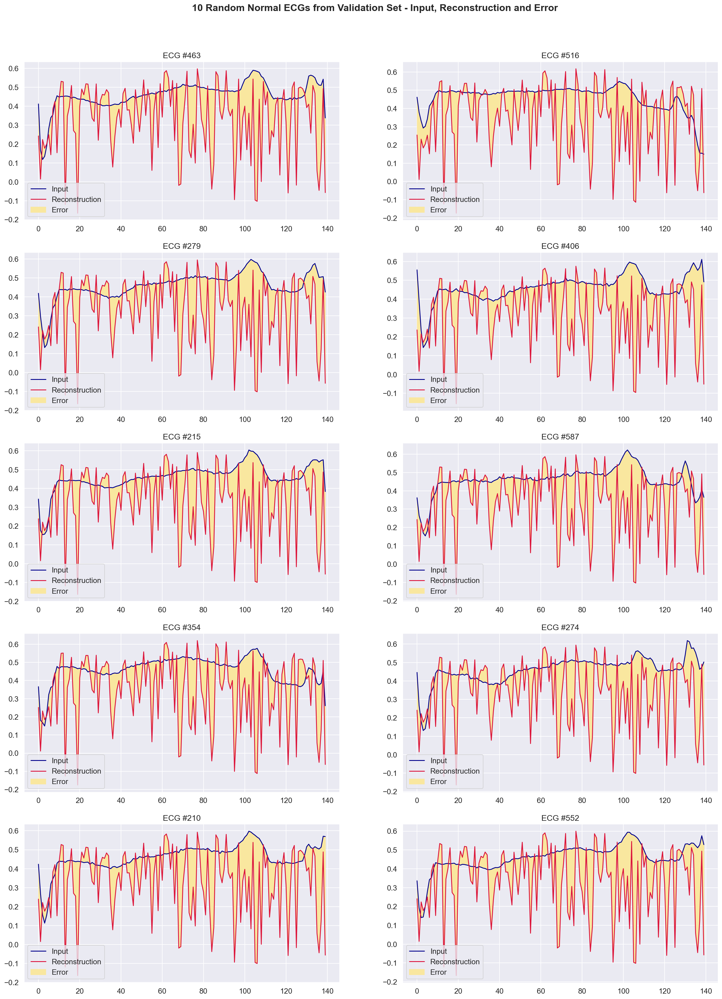

In [108]:
plot_ecg('10 Random Normal ECGs from Validation Set - Input, Reconstruction and Error', x_norm_test, 'images/pca_model_1_norm_in_out.png')

### Input vs Reconstruction for an Abnormal ECG

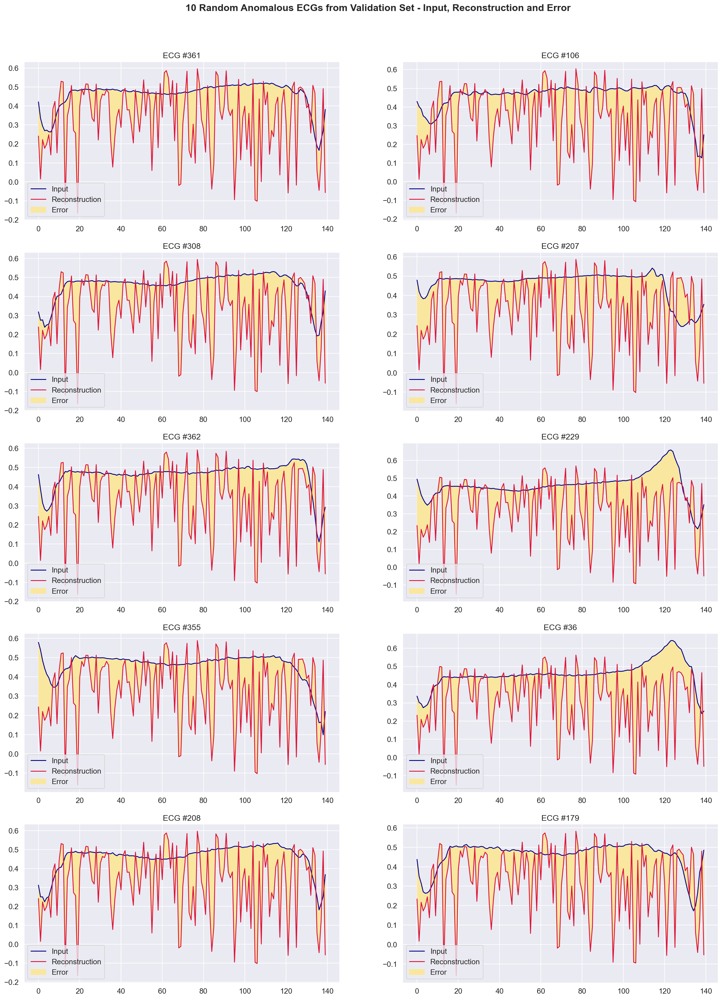

In [109]:
plot_ecg('10 Random Anomalous ECGs from Validation Set - Input, Reconstruction and Error', x_abnorm_test, 'images/pca_model_1_abnorm_in_out.png')

### Finding anomalous ECGs

We are calculating the mean squared error from examples from the normal training set, and then classifying as anomalous examples from the full test set where the error is greater than the mean of the reconstruction error summed with one standard deviation of the reconstruction error from the training set.  This sum is our threshold for determing a normal or abnormal ECG.

#### Functions needed

In [110]:
def find_threshold(model, x_train_scaled):
  reconstructions = model.predict(x_train_scaled)
  # provides losses of individual instances
  reconstruction_errors = tf.keras.losses.mse(reconstructions, x_train_scaled)

  # threshold for anomaly scores
  threshold = np.mean(reconstruction_errors.numpy()) \
      + np.std(reconstruction_errors.numpy())
  return threshold

def get_predictions(model, x_test_scaled, threshold):
  predictions = model.predict(x_test_scaled)
  # provides losses of individual instances
  errors = tf.keras.losses.mse(predictions, x_test_scaled)
  # 0 = anomaly, 1 = normal
  anomaly_mask = pd.Series(errors) > threshold
  preds = anomaly_mask.map(lambda x: 0.0 if x == True else 1.0)
  return preds

def print_stats(predictions, labels):
  print(f"Accuracy = {accuracy_score(labels, preds)}")
  print(f"Precision = {precision_score(labels, preds)}")
  print(f"Recall = {recall_score(labels, preds)}")
    

#### Histograms illustrating the distribution of loss for the normal and anomalous ECGs

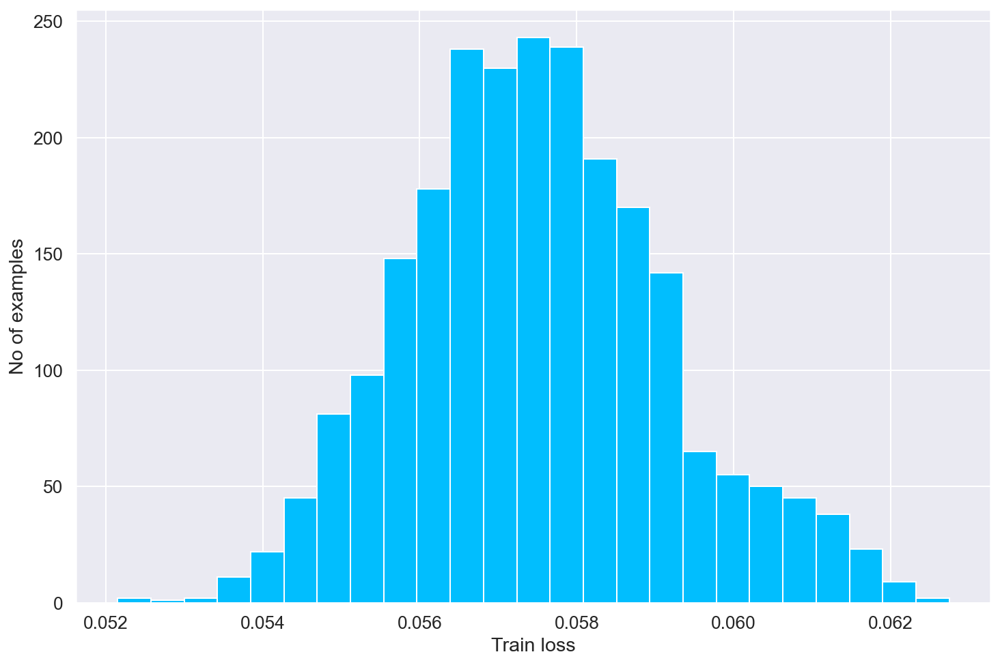

In [111]:
reconstructions = base_model.predict(x_norm_train)
train_loss = tf.keras.losses.mse(x_norm_train, reconstructions)

plt.hist(train_loss.numpy(), bins=25)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

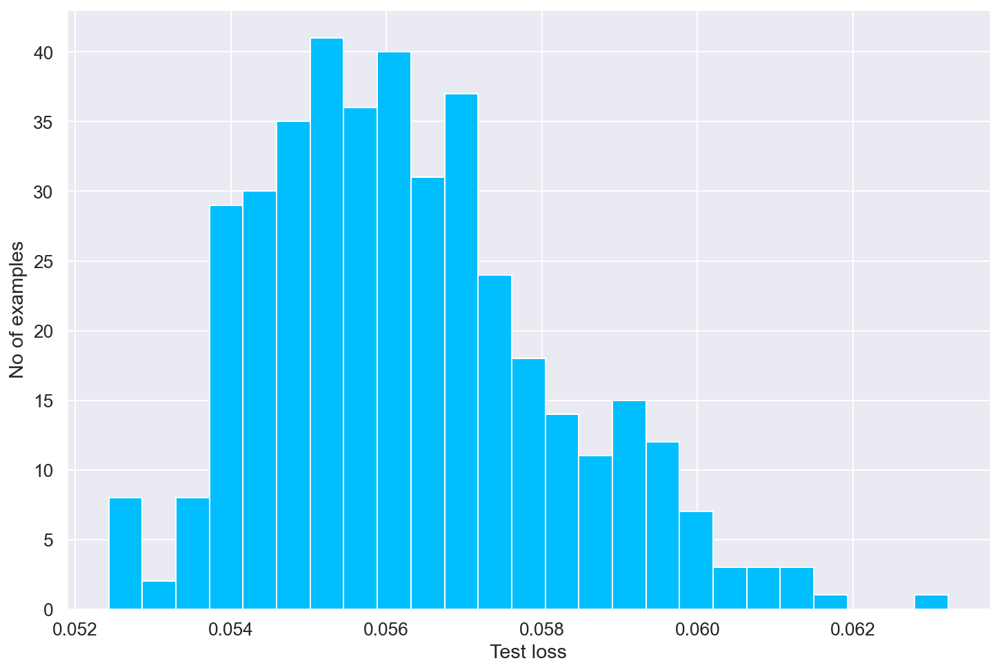

In [112]:
reconstructions = base_model.predict(x_abnorm_test)
test_loss = tf.keras.losses.mse(reconstructions, x_abnorm_test)

plt.hist(test_loss.numpy(), bins=25)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

#### Calculating threshold and getting preditions

In [113]:
threshold = find_threshold(base_model, x_norm_train)
preds = get_predictions(base_model, x_test, threshold)
print(f"Threshold: {threshold}")

Threshold: 0.05916633456945419


### Summary of Model Scores

In [114]:
print('Autoencoder - PCA scores:')
print('F1 score: %.3f' % (f1_score(y_test, preds)))
print_stats(preds, y_test)

Autoencoder - PCA scores:
F1 score: 0.687
Accuracy = 0.54
Precision = 0.5746864310148233
Recall = 0.8527918781725888


### Create a Score Dictionary

In [115]:
acc = accuracy_score(y_test, preds)
pre = precision_score(y_test, preds)

base_model_scores = {'Accuracy':acc, 'Precision':pre}
base_model_scores

{'Accuracy': 0.54, 'Precision': 0.5746864310148233}

### Confusion Matrix

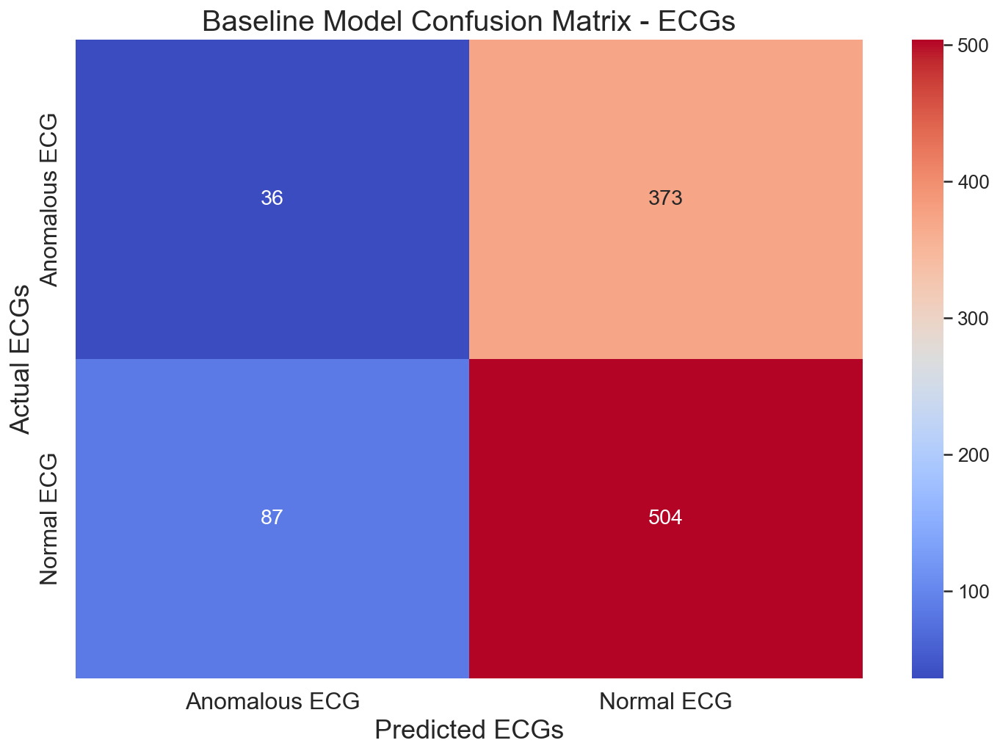

In [116]:
# Plot Confusion Matrix
cm = confusion_matrix(y_test, preds)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="coolwarm");
ax.set_title('Baseline Model Confusion Matrix - ECGs', fontsize=20);
ax.set_xlabel('Predicted ECGs',fontsize=18)
ax.set_ylabel('Actual ECGs',fontsize=18);
ax.xaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)
ax.yaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)

plt.savefig('images/pca_model_1_cm.png', dpi=300, pad_inches=0.1,)
plt.show()

This is pretty bad.  Predicting a heart condition requires far greater accuracy.  In fact, if we just guessed that every heartbeat was normal, we would get a 58.38% accuracy score, and this model's accuracy was 53%, so guessing would actually be better!.  Not unsurprisingly though, the model did do well at recognizing a normal heartbeat, since that's what it trained on.  We want to lean into the top right hand corner of the confusion matrix - this cell tells us the ECGs we predicted as normal, but they are really anomalous.  Since we don't want to tell people their heart is normal when it's really not, we want to reduce this number as much as possible, even at the expense of telling people they might have a heart condition when they really do not.  That's the number in the bottom left box.

Before we leave PCA, let's take one more shot with some adjusted parameters.  

## 2.  PCA using an Autoencoder - Take 2

The changes we'll make is to adjust the first layer of both the encoder and decoder to 8 inputs.  We'll leave the bottleneck at 2 inputs.  We'll also increase the number of ephochs from 15 to 20, since the loss was still going down after 15 epochs.

In [117]:
encoder = Sequential([
      Dense(8),      
      Dense(2),     
    ])
decoder = Sequential([
      Dense(8),     
      Dense(x_norm_train.shape[1])
    ])

In [118]:
pca_model_2 = keras.models.Sequential([encoder, decoder])
pca_model_2.compile(loss='mse', optimizer='adam')

In [119]:
history = pca_model_2.fit(
    x_norm_train,
    x_norm_train,
    epochs=20,
    batch_size=512,
    validation_data=(x_test, x_test)
)

Epoch 1/20
5/5 [==============================] - 0s 22ms/step - loss: 0.2108 - val_loss: 0.2038
Epoch 2/20
5/5 [==============================] - 0s 6ms/step - loss: 0.1974 - val_loss: 0.1886
Epoch 3/20
5/5 [==============================] - 0s 6ms/step - loss: 0.1806 - val_loss: 0.1708
Epoch 4/20
5/5 [==============================] - 0s 6ms/step - loss: 0.1613 - val_loss: 0.1506
Epoch 5/20
5/5 [==============================] - 0s 6ms/step - loss: 0.1410 - val_loss: 0.1307
Epoch 6/20
5/5 [==============================] - 0s 6ms/step - loss: 0.1208 - val_loss: 0.1111
Epoch 7/20
5/5 [==============================] - 0s 6ms/step - loss: 0.1018 - val_loss: 0.0933
Epoch 8/20
5/5 [==============================] - 0s 6ms/step - loss: 0.0843 - val_loss: 0.0771
Epoch 9/20
5/5 [==============================] - 0s 6ms/step - loss: 0.0688 - val_loss: 0.0629
Epoch 10/20
5/5 [==============================] - 0s 6ms/step - loss: 0.0554 - val_loss: 0.0510
Epoch 11/20
5/5 [=====================

In [120]:
pca_model_2.summary()

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_20 (Sequential)  (None, 2)                 1146      
                                                                 
 sequential_21 (Sequential)  (None, 140)               1284      
                                                                 
Total params: 2,430
Trainable params: 2,430
Non-trainable params: 0
_________________________________________________________________


In [121]:
pca_model_2.save("models/pca_model_2")

INFO:tensorflow:Assets written to: models/pca_model_2/assets


### Training vs. Validation loss per epoch

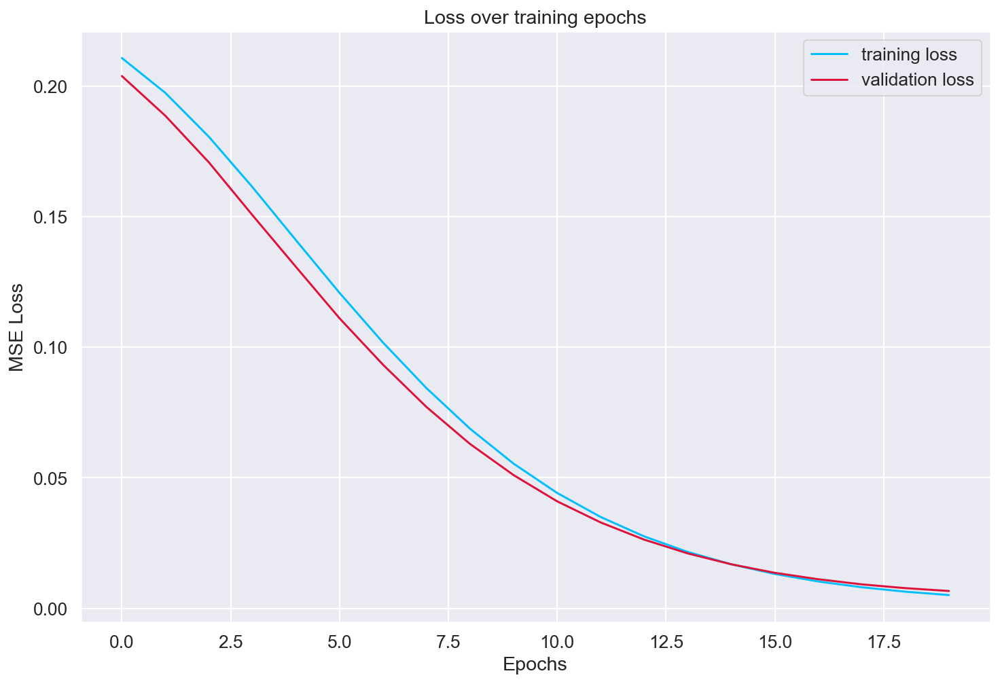

In [122]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],color='crimson')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Loss over training epochs')
plt.legend(['training loss', 'validation loss'])
plt.show();

### Input vs Reconstruction for a Normal ECG

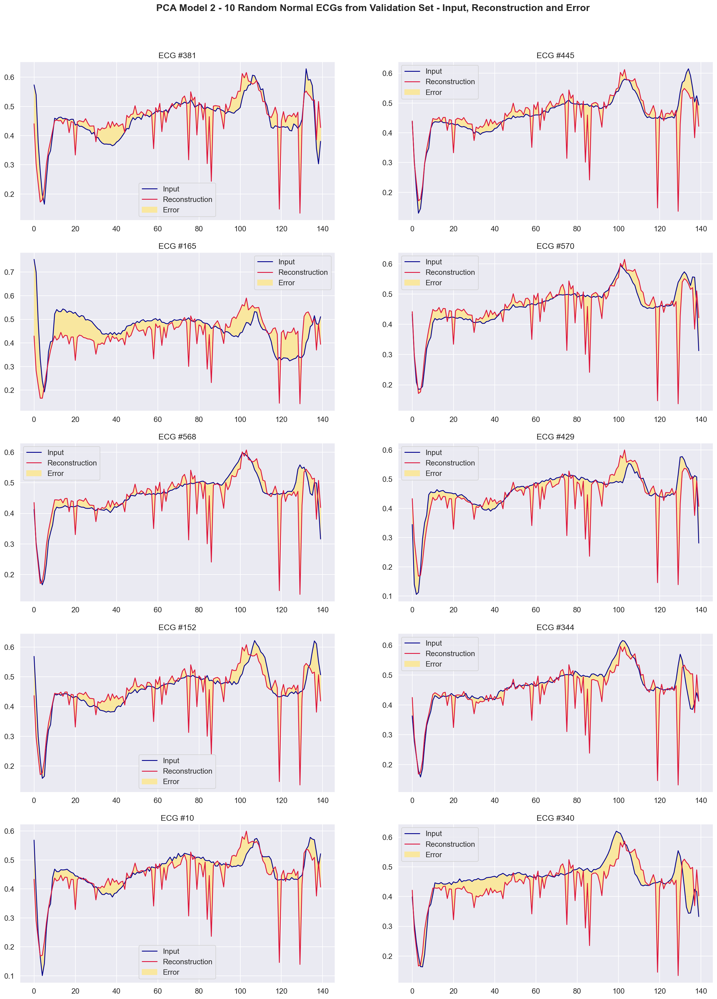

In [123]:
plot_ecg('PCA Model 2 - 10 Random Normal ECGs from Validation Set - Input, Reconstruction and Error', x_norm_test, 'images/pca_model_2_norm_in_out.png')

### Input vs Reconstruction for an Abnormal ECG

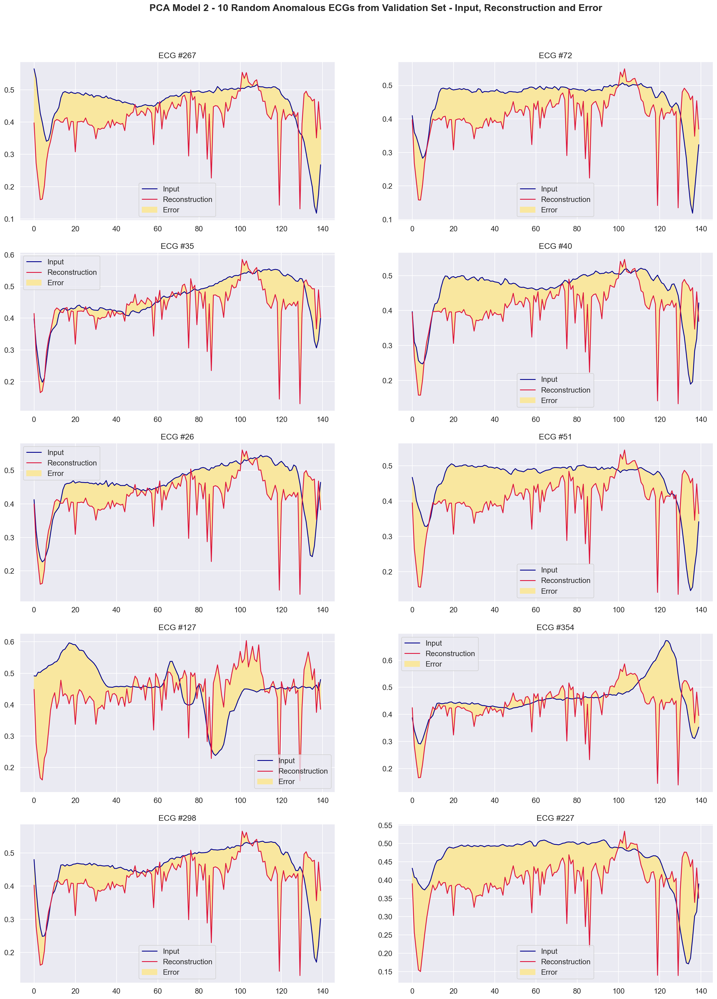

In [124]:
plot_ecg('PCA Model 2 - 10 Random Anomalous ECGs from Validation Set - Input, Reconstruction and Error', x_abnorm_test, 'images/pca_model_2_abnorm_in_out.png')

### Finding anomalous ECGs

Same calculations as the first model

#### Histograms illustrating the distribution of loss for the normal and anomalous ECGs

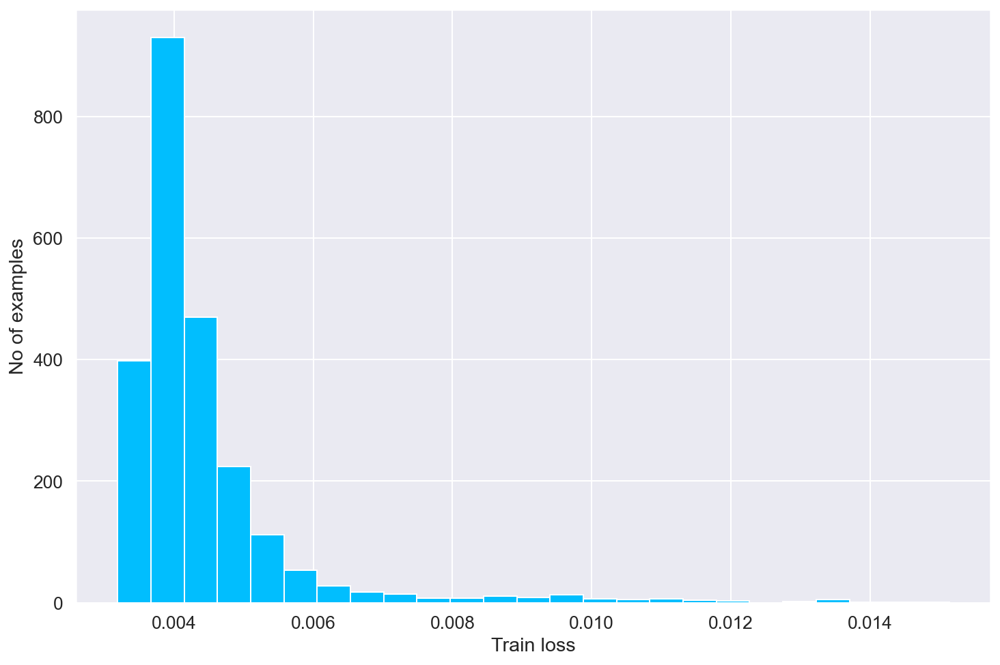

In [125]:
reconstructions = pca_model_2.predict(x_norm_train)
train_loss = tf.keras.losses.mse(x_norm_train, reconstructions)

plt.hist(train_loss.numpy(), bins=25)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

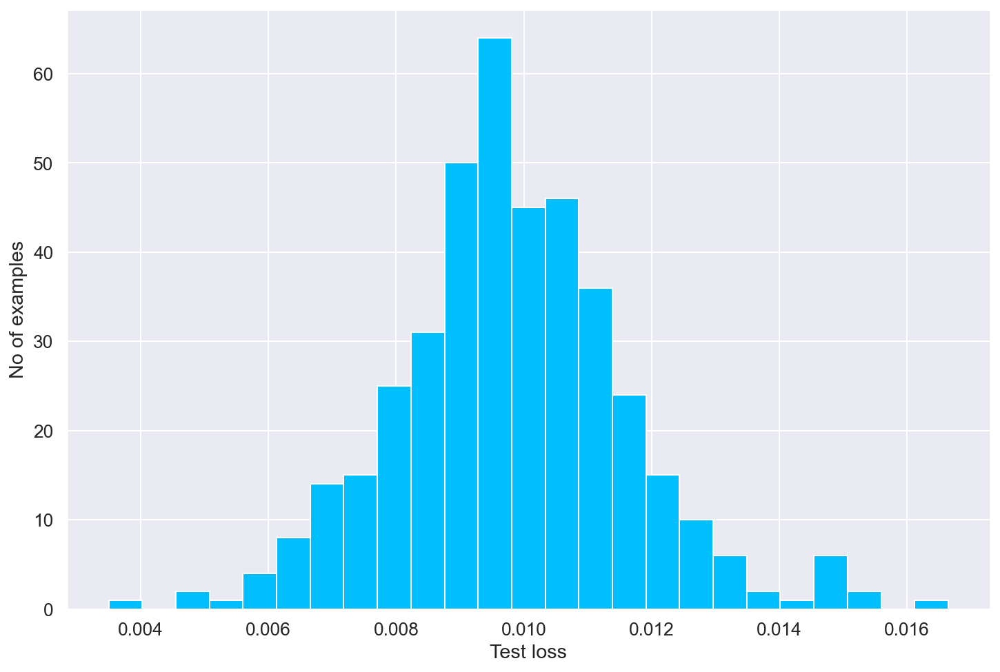

In [126]:
reconstructions = pca_model_2.predict(x_abnorm_test)
test_loss = tf.keras.losses.mse(reconstructions, x_abnorm_test)

plt.hist(test_loss.numpy(), bins=25)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

In [127]:
threshold = find_threshold(pca_model_2, x_norm_train)
preds = get_predictions(pca_model_2, x_test, threshold)
print(f"Threshold: {threshold}")

Threshold: 0.005715982522815466


### Summary of Model Scores

In [128]:
print('PCA Model 2 Scores:')
print('F1 score: %.3f' % ( f1_score(y_test, preds)))
print_stats(preds, y_test)

PCA Model 2 Scores:
F1 score: 0.953
Accuracy = 0.946
Precision = 0.9908592321755028
Recall = 0.9170896785109983


### Create a Score Dictionary

In [129]:
acc = accuracy_score(y_test, preds)
pre = precision_score(y_test, preds)

pca_model_2_scores = {'Accuracy':acc, 'Precision':pre}
pca_model_2_scores

{'Accuracy': 0.946, 'Precision': 0.9908592321755028}

### Confusion Matrix

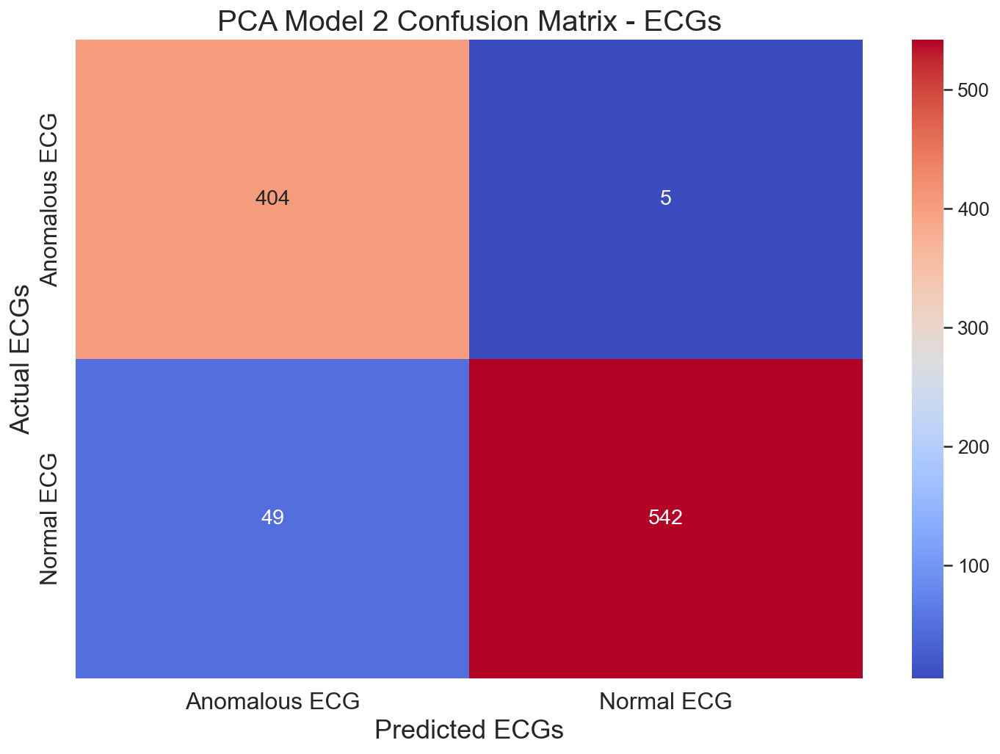

In [130]:
cm = confusion_matrix(y_test, preds)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="coolwarm");
ax.set_title('PCA Model 2 Confusion Matrix - ECGs', fontsize=20);
ax.set_xlabel('Predicted ECGs',fontsize=18)
ax.set_ylabel('Actual ECGs',fontsize=18);
ax.xaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)
ax.yaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)

plt.savefig('images/pca_model_2_cm.png', dpi=300, pad_inches=0.1,)
plt.show()

This model did much better, with 94% accuracy and almost 98% precision. However, running this model several times gives inconsistent results, as did the baseline model.  We need the model to fit the reconstructions better to the original training data, and to show better consistency, so let's move on to something different.  We'll leave the PCA model with it's linear activations and move to a true version of an autoencoder, with non-linear activations.  Also, note we'll be using mean absolute error for these models, instead of mean squared error.

## 3.  Non-Linear Neural Network Autoencoder

Several changes here - more dense layers with many more neurons, dropout layers to help prevent overfitting, and the rectified linear activation function, or ReLU, for all layers except the last decoder layer.  This layer uses the sigmoid function.

In [131]:
encoder = tf.keras.Sequential([
      Dense(64, activation='relu'),
      Dropout(0.1),
      Dense(32, activation='relu'),
      Dropout(0.1),
      Dense(16, activation='relu'),
      Dropout(0.1),
      Dense(4, activation='relu')
    ])   

In [132]:
decoder = tf.keras.Sequential([
      layers.Dense(16, activation="relu"),
      layers.Dense(32, activation="relu"),
      layers.Dense(140, activation="sigmoid")])

In [133]:
seq_model_1 = Sequential([encoder, decoder])

In [134]:
seq_model_1.compile(loss='mae', optimizer='adam')

In [135]:
history = seq_model_1.fit(
    x_norm_train,
    x_norm_train,
    epochs=50,
    batch_size=512,
    shuffle=True,
    validation_data=(x_test, x_test)
)

Epoch 1/50
5/5 [==============================] - 1s 30ms/step - loss: 0.0581 - val_loss: 0.0540
Epoch 2/50
5/5 [==============================] - 0s 7ms/step - loss: 0.0566 - val_loss: 0.0521
Epoch 3/50
5/5 [==============================] - 0s 7ms/step - loss: 0.0543 - val_loss: 0.0498
Epoch 4/50
5/5 [==============================] - 0s 7ms/step - loss: 0.0512 - val_loss: 0.0476
Epoch 5/50
5/5 [==============================] - 0s 7ms/step - loss: 0.0472 - val_loss: 0.0452
Epoch 6/50
5/5 [==============================] - 0s 7ms/step - loss: 0.0429 - val_loss: 0.0428
Epoch 7/50
5/5 [==============================] - 0s 8ms/step - loss: 0.0388 - val_loss: 0.0405
Epoch 8/50
5/5 [==============================] - 0s 8ms/step - loss: 0.0351 - val_loss: 0.0389
Epoch 9/50
5/5 [==============================] - 0s 8ms/step - loss: 0.0317 - val_loss: 0.0376
Epoch 10/50
5/5 [==============================] - 0s 8ms/step - loss: 0.0293 - val_loss: 0.0365
Epoch 11/50
5/5 [=====================

In [136]:
seq_model_1.summary()

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_23 (Sequential)  (None, 4)                 11700     
                                                                 
 sequential_24 (Sequential)  (None, 140)               5244      
                                                                 
Total params: 16,944
Trainable params: 16,944
Non-trainable params: 0
_________________________________________________________________


In [137]:
seq_model_1.save("models/seq_model_1")

INFO:tensorflow:Assets written to: models/seq_model_1/assets


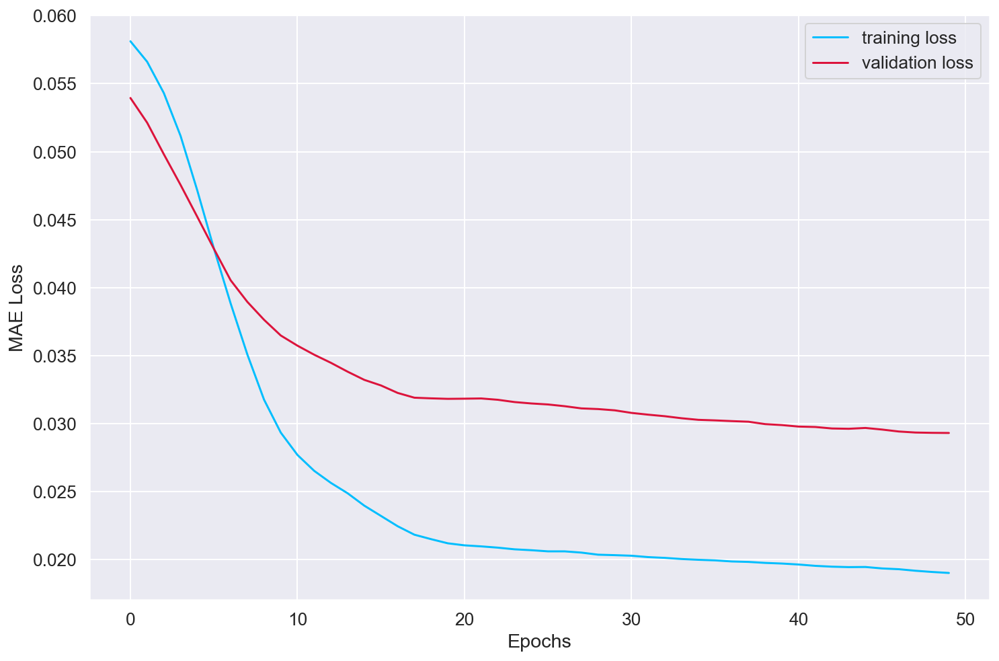

In [138]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],color='crimson')
plt.xlabel('Epochs')
plt.ylabel('MAE Loss')
plt.legend(['training loss', 'validation loss'])
plt.show()

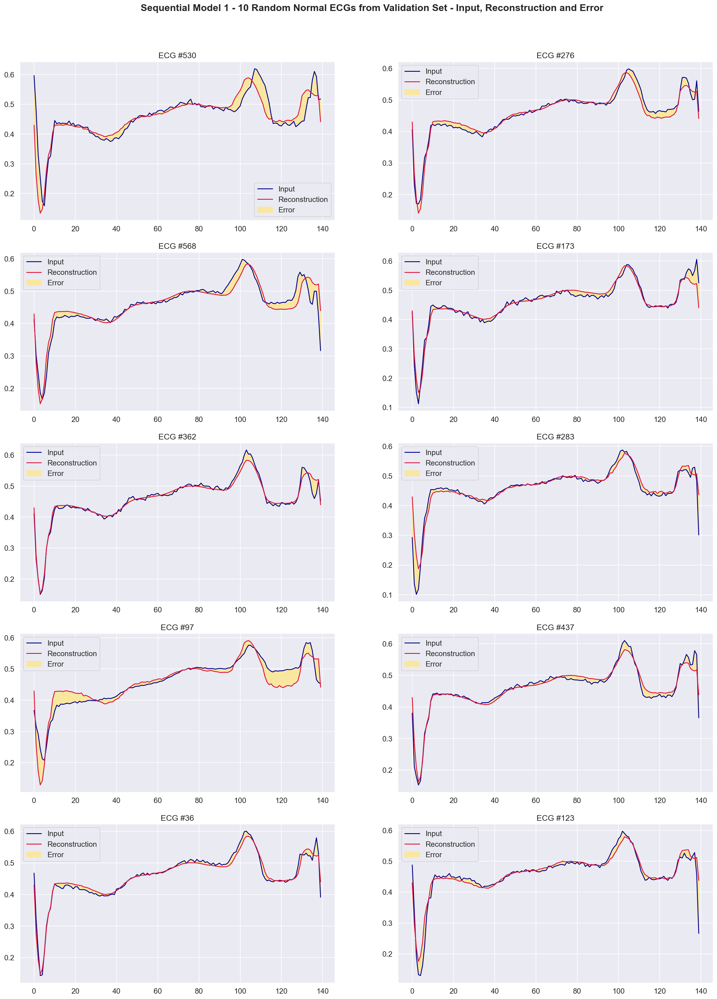

In [139]:
plot_ecg('Sequential Model 1 - 10 Random Normal ECGs from Validation Set - Input, Reconstruction and Error', x_norm_test, 'images/seq_model_1_norm_in_out.png')

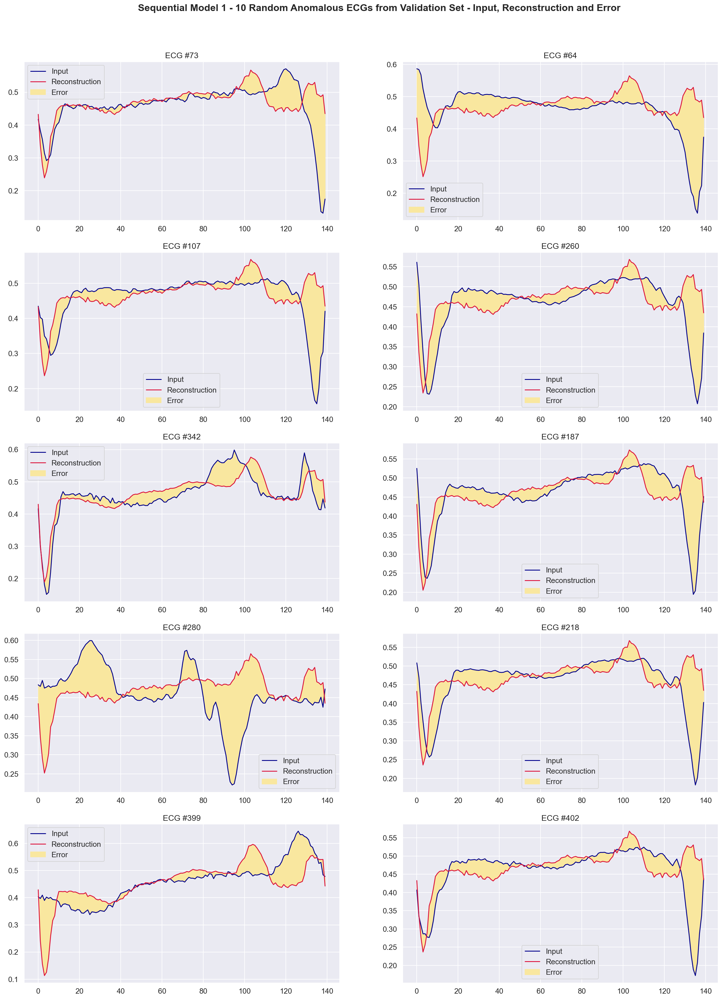

In [140]:
plot_ecg('Sequential Model 1 - 10 Random Anomalous ECGs from Validation Set - Input, Reconstruction and Error', x_abnorm_test, 'images/seq_model_1_abnorm_in_out.png')

#### Histograms illustrating the distribution of loss for the normal and anomalous ECGs

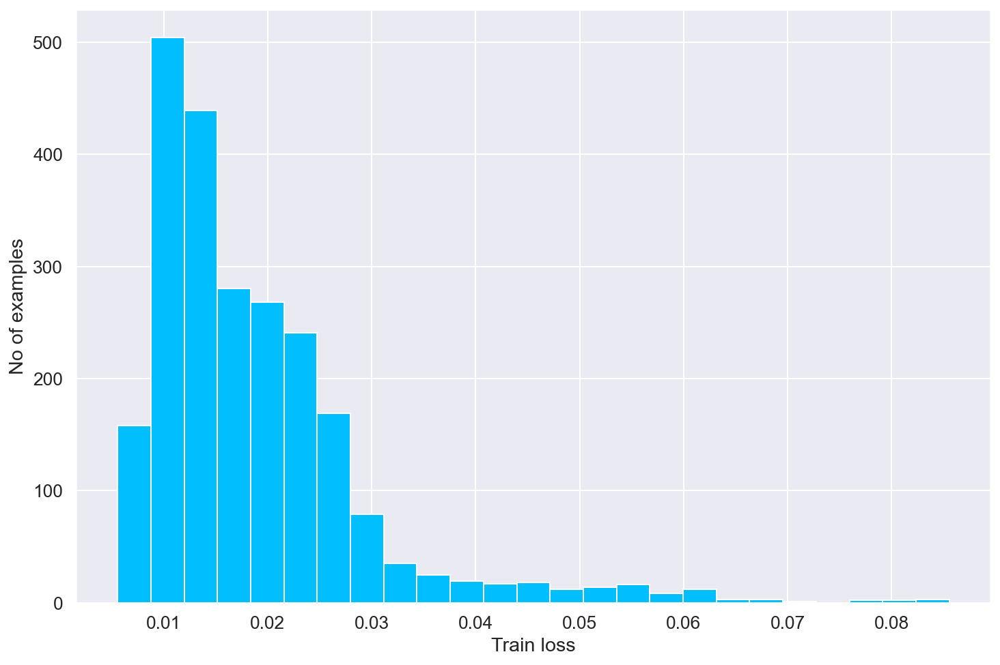

In [141]:
reconstructions = seq_model_1.predict(x_norm_train)
train_loss = tf.keras.losses.mae(x_norm_train, reconstructions)

plt.hist(train_loss.numpy(), bins=25)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

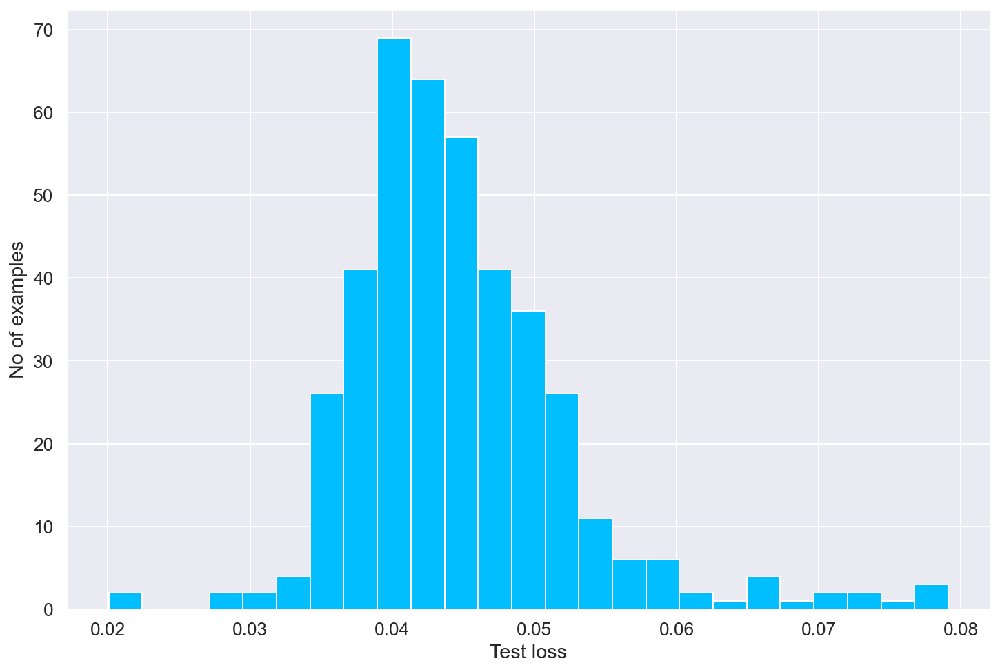

In [142]:
reconstructions = seq_model_1.predict(x_abnorm_test)
test_loss = tf.keras.losses.mae(reconstructions, x_abnorm_test)

plt.hist(test_loss.numpy(), bins=25)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

#### New functions - calculating loss using Mean Absolute Error (MAE)

In [143]:
def find_threshold(model, x_train_scaled):
  reconstructions = model.predict(x_train_scaled)
  # provides losses of individual instances
  reconstruction_errors = tf.keras.losses.mae(reconstructions, x_train_scaled)

  # threshold for anomaly scores
  threshold = np.mean(reconstruction_errors.numpy()) \
      + np.std(reconstruction_errors.numpy())
  return threshold

def get_predictions(model, x_test_scaled, threshold):
  predictions = model.predict(x_test_scaled)
  # provides losses of individual instances
  errors = tf.keras.losses.mae(predictions, x_test_scaled)
  # 0 = anomaly, 1 = normal
  anomaly_mask = pd.Series(errors) > threshold
  preds = anomaly_mask.map(lambda x: 0.0 if x == True else 1.0)
  return preds

def print_stats(predictions, labels):
  print(f"Accuracy = {accuracy_score(labels, preds)}")
  print(f"Precision = {precision_score(labels, preds)}")
  print(f"Recall = {recall_score(labels, preds)}")

In [144]:
threshold = find_threshold(seq_model_1, x_norm_train)
preds = get_predictions(seq_model_1, x_test, threshold)
print(f"Threshold: {threshold}")

Threshold: 0.02926175482571125


### Summary of Model Scores

In [145]:
print('Sequential Model 1 Scores:')
print('F1 score: %.3f' % ( f1_score(y_test, preds)))
print_stats(preds, y_test)

Sequential Model 1 Scores:
F1 score: 0.951
Accuracy = 0.944
Precision = 0.9944547134935305
Recall = 0.9103214890016921


### Create a Score Dictionary

In [146]:
acc = accuracy_score(y_test, preds)
pre = precision_score(y_test, preds)

seq_model_1_scores = {'Accuracy':acc, 'Precision':pre}
seq_model_1_scores

{'Accuracy': 0.944, 'Precision': 0.9944547134935305}

### Confusion Matrix

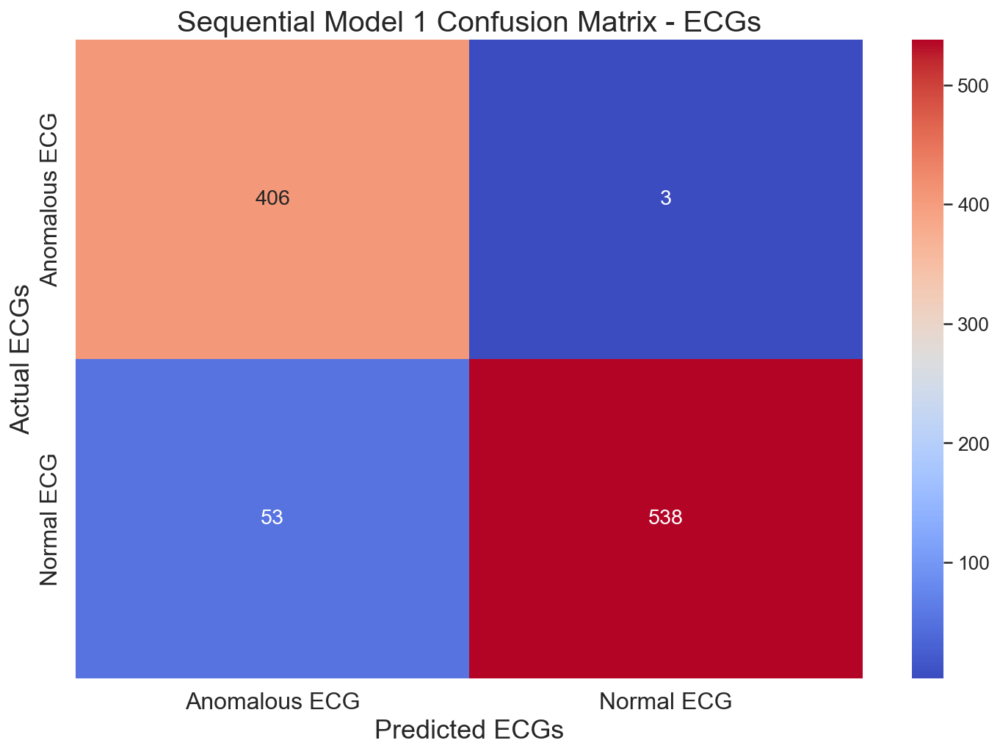

In [147]:
cm = confusion_matrix(y_test, preds)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="coolwarm");
ax.set_title('Sequential Model 1 Confusion Matrix - ECGs', fontsize=20);
ax.set_xlabel('Predicted ECGs',fontsize=18)
ax.set_ylabel('Actual ECGs',fontsize=18);
ax.xaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)
ax.yaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)

plt.savefig('images/seq_model_1_cm.png', dpi=300, pad_inches=0.1,)
plt.show()

This is progress - we're definitely doing well in minimizing the misidentified anomalous ECGs with a 95% accuracy and a 99% precision score.  But, we'd like to see the number in the bottom left (false positives) of the matrix go down, also.  Below is a function that will look for our best parameters for this model and store our results in a dictionary.  Let see how it does.

## 4.  Searching for the best model using Keras Tuner

Keras tuner code adapted from [analyticvidhya.com](https://www.analyticsvidhya.com/blog/2021/05/anomaly-detection-using-autoencoders-a-walk-through-in-python/)

The tuner will use 4 layers each for the encoder and decoder, with a code size of 8 for the bottleneck. It will iterate through input / output values from 16 - 72 in increments of 4, and through learning rates of .01, .001, and .0001.  Loss will be calculated as Mean Absolute Error, and Adam will be the optimizer, as in the previous model.  The results are stored, and the best model hyperparameters will be retrieved to compile and fit the model below.

In [148]:
import keras_tuner as kt

class AutoEncoderTuner(Model):

  def __init__(self, hp, output_units, code_size=8):
    super().__init__()
    dense_1_units = hp.Int('dense_1_units', min_value=16, max_value=72, step=4)
    dense_2_units = hp.Int('dense_2_units', min_value=16, max_value=72, step=4)
    dense_3_units = hp.Int('dense_3_units', min_value=16, max_value=72, step=4)
    dense_4_units = hp.Int('dense_4_units', min_value=16, max_value=72, step=4)
    dense_5_units = hp.Int('dense_5_units', min_value=16, max_value=72, step=4)
    dense_6_units = hp.Int('dense_6_units', min_value=16, max_value=72, step=4)
    
    self.encoder = Sequential([
      Dense(dense_1_units, activation='relu'),
      Dropout(0.1),
      Dense(dense_2_units, activation='relu'),
      Dropout(0.1),
      Dense(dense_3_units, activation='relu'),
      Dropout(0.1),
      Dense(code_size, activation='relu')
    ])
    self.decoder = Sequential([
      Dense(dense_4_units, activation='relu'),
      Dropout(0.1),
      Dense(dense_5_units, activation='relu'),
      Dropout(0.1),
      Dense(dense_6_units, activation='relu'),
      Dropout(0.1),
      Dense(output_units, activation='sigmoid')
    ])
  
  def call(self, inputs):
    encoded = self.encoder(inputs)
    decoded = self.decoder(encoded)
    return decoded


def build_model(hp):
  model = AutoEncoderTuner(hp, 140)
  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
  model.compile(
      loss='mae',
      optimizer=Adam(learning_rate=hp_learning_rate),
  )
  return model

In [149]:
tuner = kt.Hyperband(
    build_model,
    objective='val_loss',
    max_epochs=30,
    factor=4,
    directory='autoencoder',
    project_name='tuning_autoencoder6'
)

tuner.search(
    x_norm_train, 
    x_norm_train, 
    epochs=30, 
    batch_size=512,
    validation_data=(x_test, x_test)
)

INFO:tensorflow:Reloading Oracle from existing project autoencoder/tuning_autoencoder6/oracle.json
INFO:tensorflow:Reloading Tuner from autoencoder/tuning_autoencoder6/tuner0.json
INFO:tensorflow:Oracle triggered exit


In [150]:
hparams = [f'dense_{i}_units' for i in range(1,7)] + ['learning_rate']
best_hyperparams = tuner.get_best_hyperparameters()
for hps in hparams:
  print(f"{hps}: {best_hyperparams[0][hps]}")

dense_1_units: 28
dense_2_units: 60
dense_3_units: 64
dense_4_units: 64
dense_5_units: 60
dense_6_units: 60
learning_rate: 0.001


### Best Model from Keras Tuner

The setup is just like the other models

In [151]:
encoder = Sequential([
      Dense(list({best_hyperparams[0]['dense_1_units']})[0], activation='relu'),
      Dropout(0.1),
      Dense(list({best_hyperparams[0]['dense_2_units']})[0], activation='relu'),
      Dropout(0.1),
      Dense(list({best_hyperparams[0]['dense_3_units']})[0], activation='relu'),
      Dropout(0.1),
      Dense(8, activation='relu')
    ])
decoder = Sequential([
      Dense(list({best_hyperparams[0]['dense_4_units']})[0], activation='relu'),
      Dropout(0.1),
      Dense(list({best_hyperparams[0]['dense_5_units']})[0], activation='relu'),
      Dropout(0.1),
      Dense(list({best_hyperparams[0]['dense_6_units']})[0], activation='relu'),
      Dropout(0.1),
      Dense(140, activation='sigmoid')
    ])

In [152]:
best_model = keras.models.Sequential([encoder, decoder])
best_model.compile(loss='mae', optimizer=Adam(learning_rate=list({best_hyperparams[0]['learning_rate']})[0]))

history = best_model.fit(
    x_norm_train,
    x_norm_train,
    epochs=30,
    batch_size=512,
    validation_data=(x_test, x_test)
)

Epoch 1/30
5/5 [==============================] - 1s 30ms/step - loss: 0.0581 - val_loss: 0.0535
Epoch 2/30
5/5 [==============================] - 0s 8ms/step - loss: 0.0554 - val_loss: 0.0502
Epoch 3/30
5/5 [==============================] - 0s 9ms/step - loss: 0.0500 - val_loss: 0.0467
Epoch 4/30
5/5 [==============================] - 0s 8ms/step - loss: 0.0449 - val_loss: 0.0431
Epoch 5/30
5/5 [==============================] - 0s 8ms/step - loss: 0.0403 - val_loss: 0.0408
Epoch 6/30
5/5 [==============================] - 0s 8ms/step - loss: 0.0370 - val_loss: 0.0393
Epoch 7/30
5/5 [==============================] - 0s 8ms/step - loss: 0.0346 - val_loss: 0.0382
Epoch 8/30
5/5 [==============================] - 0s 8ms/step - loss: 0.0328 - val_loss: 0.0374
Epoch 9/30
5/5 [==============================] - 0s 8ms/step - loss: 0.0313 - val_loss: 0.0368
Epoch 10/30
5/5 [==============================] - 0s 9ms/step - loss: 0.0300 - val_loss: 0.0361
Epoch 11/30
5/5 [=====================

In [153]:
best_model.summary()

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_28 (Sequential)  (None, 8)                 10112     
                                                                 
 sequential_29 (Sequential)  (None, 140)               16676     
                                                                 
Total params: 26,788
Trainable params: 26,788
Non-trainable params: 0
_________________________________________________________________


In [154]:
best_model.save("models/best_model")

INFO:tensorflow:Assets written to: models/best_model/assets


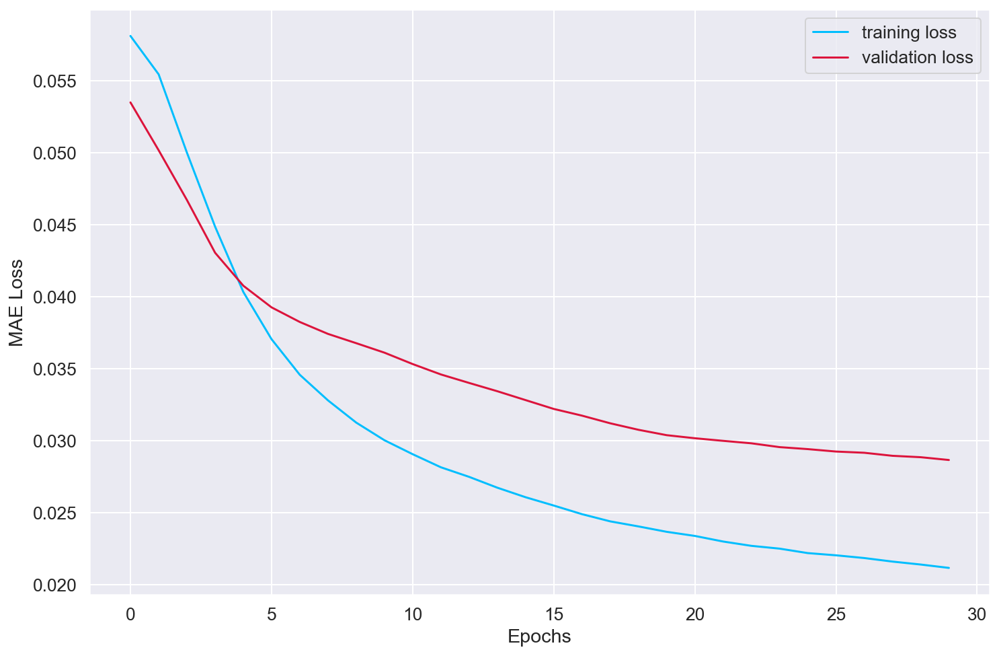

In [155]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],color='crimson')
plt.xlabel('Epochs')
plt.ylabel('MAE Loss')
plt.legend(['training loss', 'validation loss'])
plt.show()

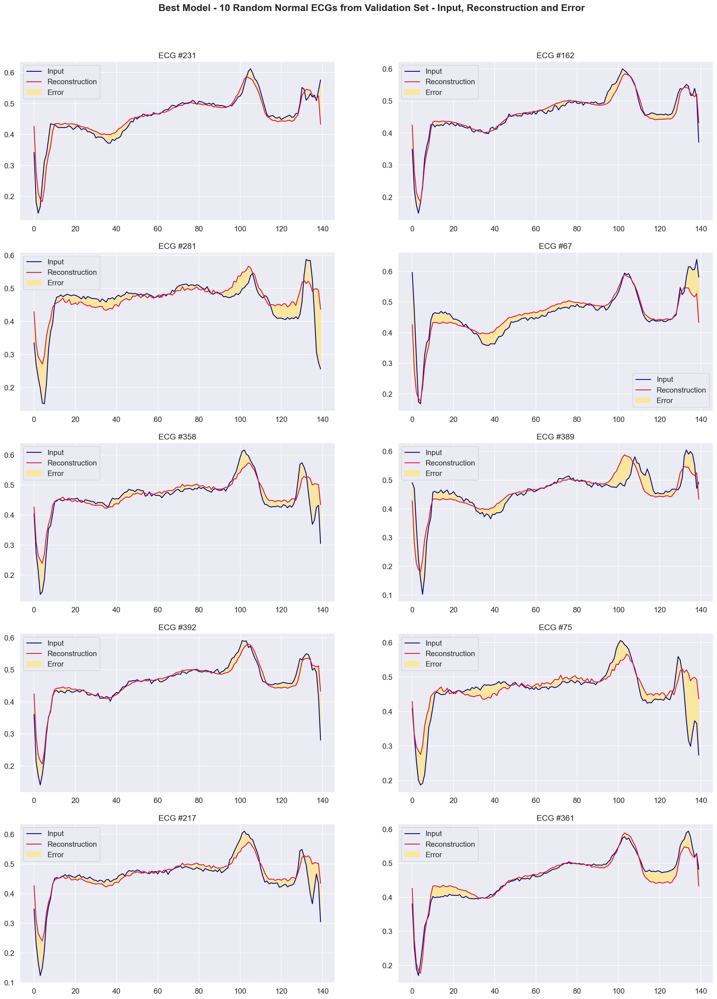

In [156]:
plot_ecg('Best Model - 10 Random Normal ECGs from Validation Set - Input, Reconstruction and Error', x_norm_test, 'images/best_model_norm_in_out.png')

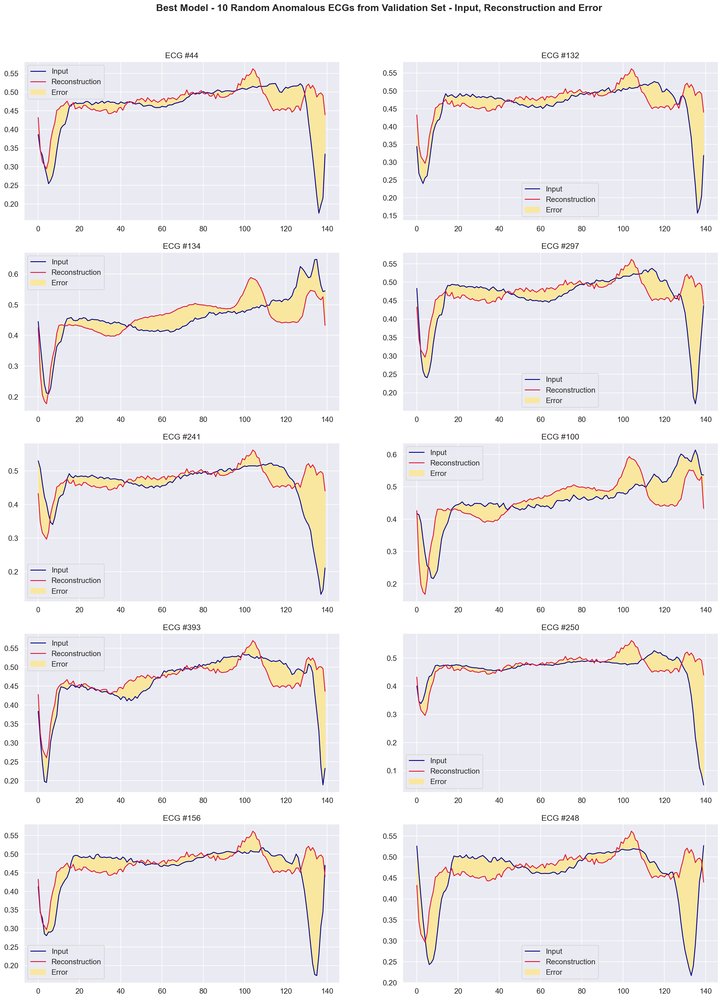

In [157]:
plot_ecg('Best Model - 10 Random Anomalous ECGs from Validation Set - Input, Reconstruction and Error', x_abnorm_test, 'images/best_model_abnorm_in_out.png')

#### Histograms illustrating the distribution of loss for the normal and anomalous ECGs

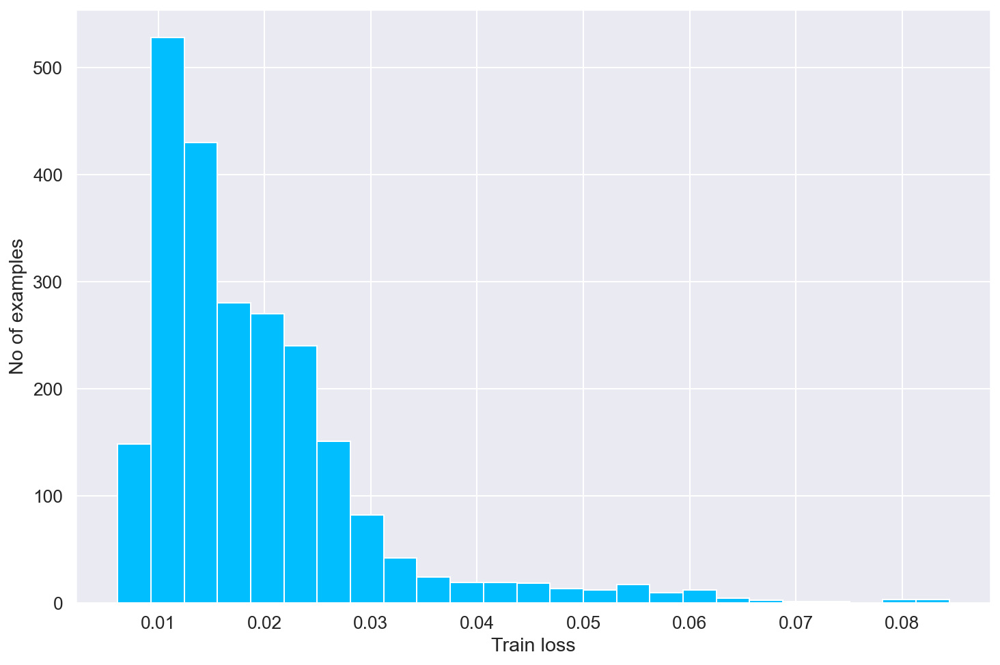

In [158]:
reconstructions = best_model.predict(x_norm_train)
train_loss = tf.keras.losses.mae(x_norm_train, reconstructions)

plt.hist(train_loss.numpy(), bins=25)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

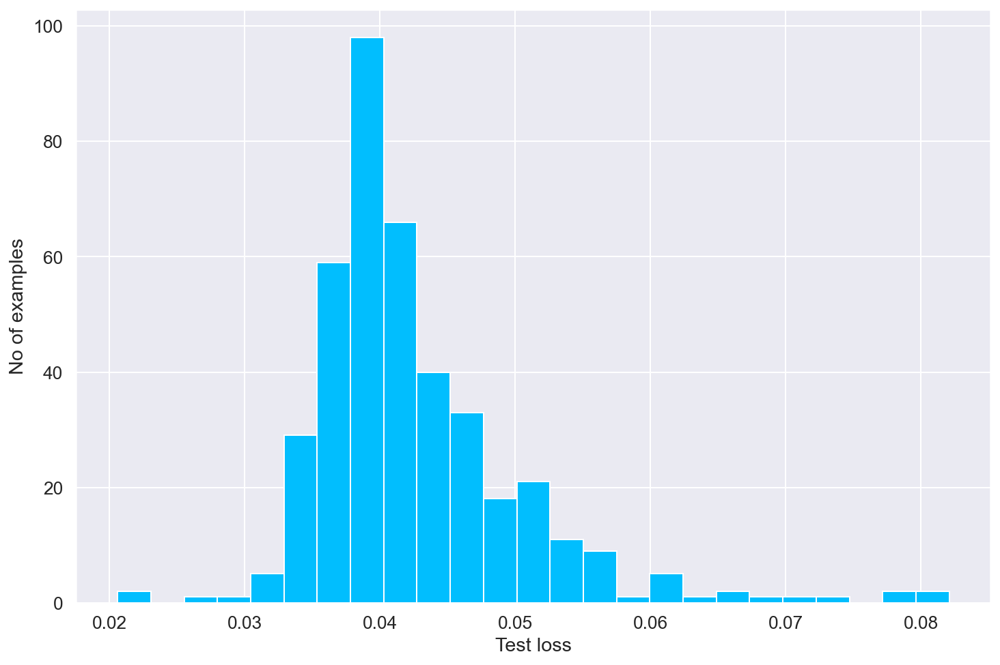

In [159]:
reconstructions = best_model.predict(x_abnorm_test)
test_loss = tf.keras.losses.mae(reconstructions, x_abnorm_test)

plt.hist(test_loss.numpy(), bins=25)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

In [160]:
threshold = find_threshold(best_model, x_norm_train)
preds = get_predictions(best_model, x_test, threshold)
print(f"Threshold: {threshold}")

Threshold: 0.029490463435649872


### Summary of Model Scores

In [161]:
print('Best Model Scores:')
print('F1 score: %.3f' % ( f1_score(y_test, preds)))
print_stats(preds, y_test)

Best Model Scores:
F1 score: 0.949
Accuracy = 0.942
Precision = 0.9926062846580407
Recall = 0.9086294416243654


### Create a Score Dictionary

In [162]:
acc = accuracy_score(y_test, preds)
pre = precision_score(y_test, preds)

best_model_scores = {'Accuracy':acc, 'Precision':pre}
best_model_scores

{'Accuracy': 0.942, 'Precision': 0.9926062846580407}

### Confusion Matrix

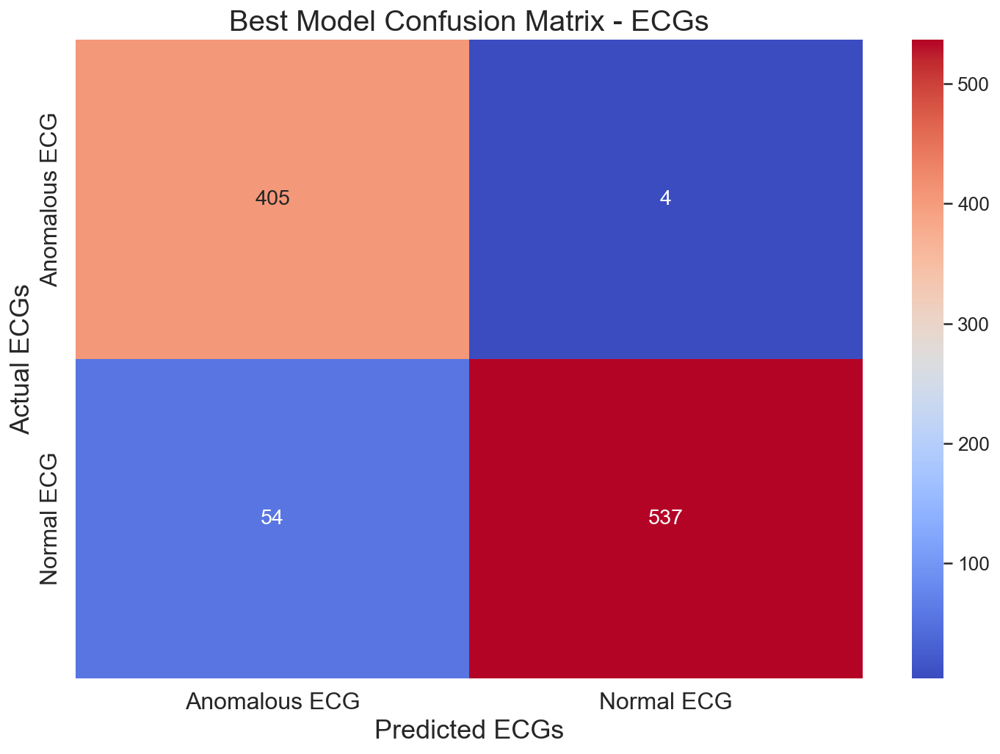

In [163]:
cm = confusion_matrix(y_test, preds)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="coolwarm");
ax.set_title('Best Model Confusion Matrix - ECGs', fontsize=20);
ax.set_xlabel('Predicted ECGs',fontsize=18)
ax.set_ylabel('Actual ECGs',fontsize=18);
ax.xaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)
ax.yaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)

plt.savefig('images/best_model_cm.png', dpi=300, pad_inches=0.1,)
plt.show()

This model was consistently giveing 3 false positives (always the same 3 ECGs); the false negatives ranged from 45 - 55. A little tweaking on the number of epochs being run by keras tuner and it begain to only have 2 false positives. It is the most consistent performer on every model run.  The accuracy score for this run was 95.3%, and precision was 99.6%.

### A look at False Positives

I also looked at the graphs for the incorrect predictions we made (examples below). For the 2 false positives, the graphs show a fairly faithful reproduction with, by appearance, a low error rate.  Obviously, something that couldn't be detected by the trained model was wrong with these ECGs.  For the false negatives, for the most part, it appears as though the model just did a poor job of recognizing these ECGs, as the reconstructions are not faithful to the originals.

In [164]:
def idx_fp(y_actual, y_pred):
    TP = 0
    FP = 0
    TN = 0
    FN = 0
    fp = []

    for i in range(len(y_pred)):
        if y_actual[i]==y_pred[i]==1:
           TP += 1
        if y_pred[i]==1 and y_actual[i]!=y_pred[i]:
           fp.append(i)
           FP += 1
        if y_actual[i]==y_pred[i]==0:
           TN += 1
        if y_pred[i]==0 and y_actual[i]!=y_pred[i]:
           FN += 1
    return(fp)

def plot_fp(title, df, idx, save_file_name):
    
    encoded_imgs = encoder(df).numpy()
    decoded_imgs = decoder(encoded_imgs).numpy()
    
    a = 5  # number of rows
    b = 2  # number of columns
    c = 1  # initialize plot counter
    
    fig = plt.figure(figsize=(22,30))
    fig.tight_layout()
    
    for i in range(len(idx)):
        x = idx[i]
        plt.subplot(a, b, c)
        plt.plot(df[x],'darkblue',)
        plt.plot(decoded_imgs[x],'crimson')
        plt.fill_between(np.arange(140), decoded_imgs[x], df[x], color='#F9E79F' )
        plt.title(f'ECG #{x+1}')
        plt.legend(labels=["Input", "Reconstruction", "Error"])
        c = c + 1
    
    plt.suptitle(title, 
             x=(50-(len(title)/4))/100, y=.92, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
    plt.savefig(save_file_name, dpi=300, pad_inches=0.1,)
    plt.show()

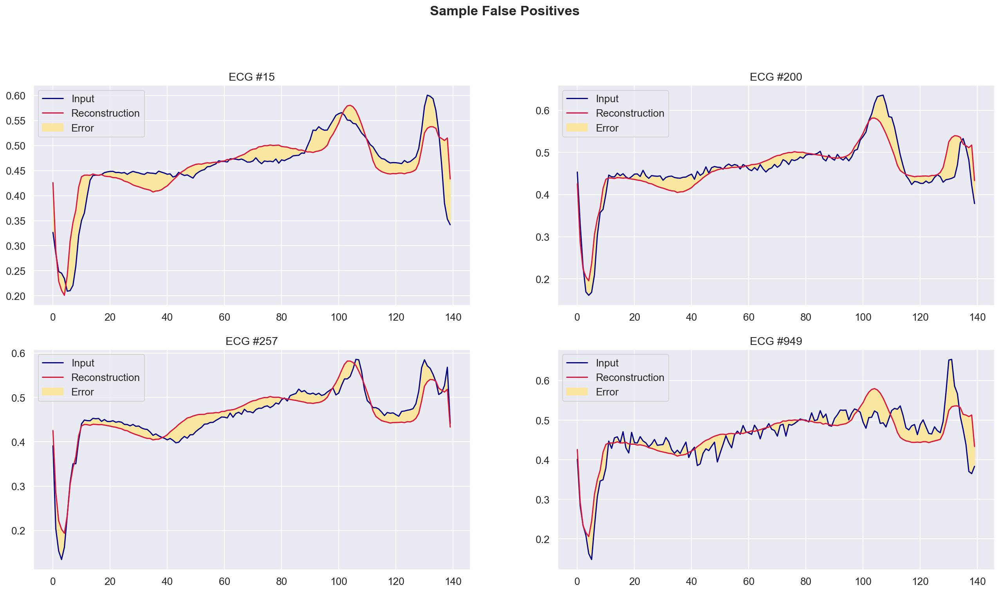

In [165]:
plot_fp("Sample False Positives", x_test, idx_fp(y_test, preds), 'images/sample false positives')

### Same look at False Negatives

In [166]:
def idx_fn(y_actual, y_pred):
    TP = 0
    FP = 0
    TN = 0
    FN = 0
    fn = []

    for i in range(len(y_pred)): 
        if y_actual[i]==y_pred[i]==1:
           TP += 1
        if y_pred[i]==1 and y_actual[i]!=y_pred[i]:
           FP += 1
        if y_actual[i]==y_pred[i]==0:
           TN += 1
        if y_pred[i]==0 and y_actual[i]!=y_pred[i]:
           fn.append(i)
           FN += 1
    return(fn)

In [167]:
false_neg = idx_fn(y_test,preds)
sample = random.sample(false_neg, 10)

In [168]:
def plot_fn(title, df, idx, save_file_name):
    
    encoded_imgs = encoder(df).numpy()
    decoded_imgs = decoder(encoded_imgs).numpy()
    
    a = 5  # number of rows
    b = 2  # number of columns
    c = 1  # initialize plot counter
    
    fig = plt.figure(figsize=(22,30))
    fig.tight_layout()
    
    for i in range(len(idx)):
        x = idx[i]
        plt.subplot(a, b, c)
        plt.plot(df[x],'darkblue',)
        plt.plot(decoded_imgs[x],'crimson')
        plt.fill_between(np.arange(140), decoded_imgs[x], df[x], color='#F9E79F' )
        plt.title(f'ECG #{x+1}')
        plt.legend(labels=["Input", "Reconstruction", "Error"])
        c = c + 1
    
    plt.suptitle(title, 
             x=(50-(len(title)/4))/100, y=.92, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
    plt.savefig(save_file_name, dpi=300, pad_inches=0.1,)
    plt.show()

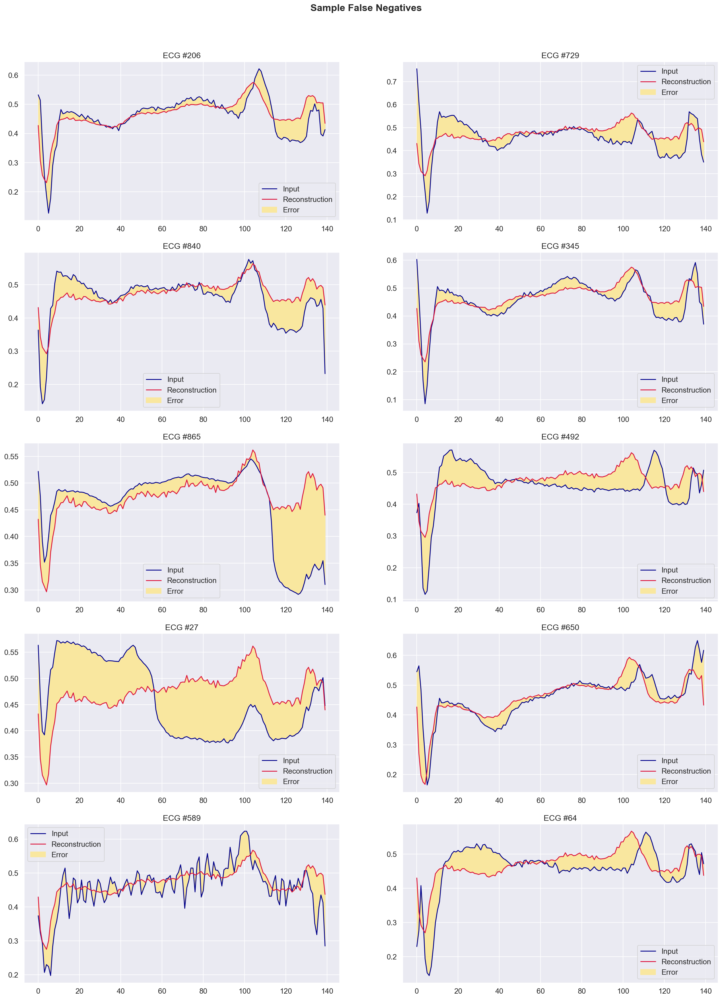

In [169]:
plot_fn("Sample False Negatives", x_test, sample, 'images/sample false negatives')

## Evaluation
The precision metric was the primary metric I used, because it tells the percentage of the time I was predicting a normal heartbeat and getting it right.  It made more sense to give this metric the most attention, since we would rather tell someone they had a heart condition and find out they didn't than tell them they have a healthy heart when they do not.  (Truly, we'd rather get every single ECG right, but our models are not that good, yet!)  I made heavy use of loss curves for every model to make sure they were not overfitting.  For correctly differentiating between normal and abnormal heartbeats, and also having the fewest number of false positives, the best model was the autoencoder tuned with keras tuner.  The model had a precision score of ~99% on the unseen test data, meaning that of the all the people predicted of having a normal heartbeat, the model was correct ~99% of the time.  The model had an accuracy score of ~95%, which means it accurately evaluated all of the ECGs about 95% of the time.  Compared to the baseline model scores of 53% accuracy and 56% precision, this was a huge improvement over the initial model.  It was also notable that the 2nd PCA model had high scores, but both PCA models could be inconsistent in their results.  In the end, the keras tuned model was the best choice.   

## The Score Slide!

### Putting the scoring dictionaries in a dataframe

In [170]:
score_dict_list = [base_model_scores, pca_model_2_scores, seq_model_1_scores, best_model_scores]
score_dict_list

scores = pd.DataFrame(score_dict_list)
scores.reset_index(drop=True, inplace=True)
scores = scores.transpose()
scores.rename(columns = {0: "Baseline Model", 1: 'Model 2 - PCA', 2: 'Non-Linear Autoencoder', 3: 'Keras Tuned Autoencoder'}, inplace=True)
scores.to_csv('data/scores.csv')
scores

,Baseline Model,Model 2 - PCA,Non-Linear Autoencoder,Keras Tuned Autoencoder
Accuracy,0.540000,0.946000,0.944000,0.942000
Precision,0.574686,0.990859,0.994455,0.992606


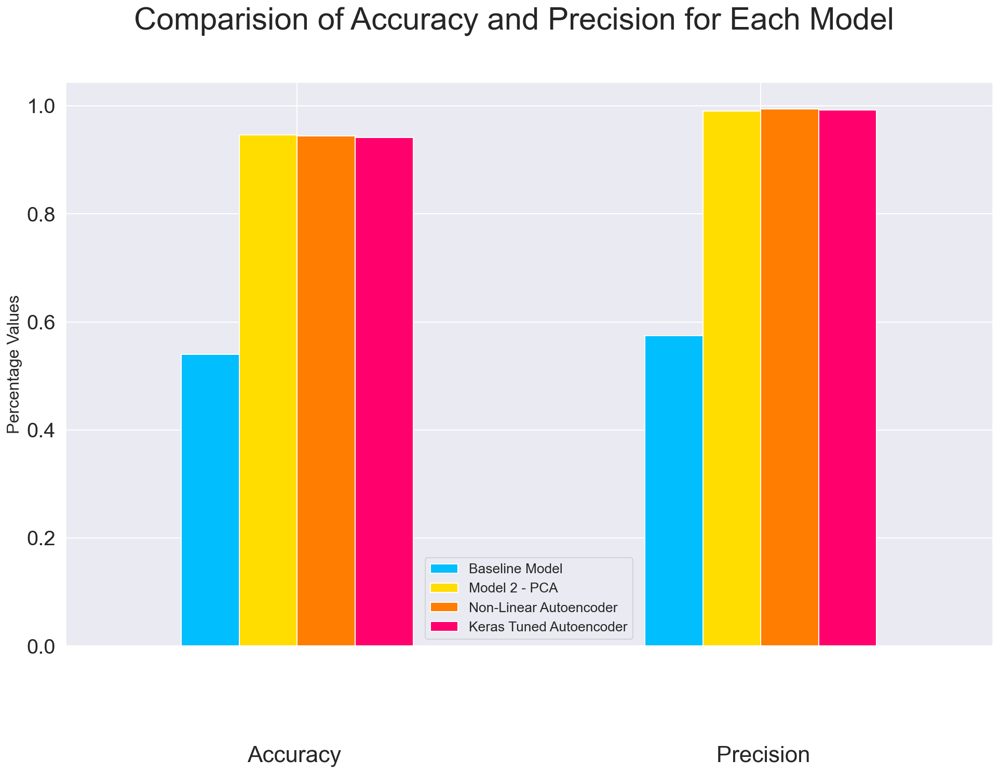

In [171]:
scores.plot(figsize = (16,10), kind='bar', legend=True,  xlabel='Accuracy and Precision Comparisons', fontsize=20)
plt.xlabel('Accuracy                                                           Precision', fontsize=22)
plt.ylabel('Percentage Values', fontsize=16)
plt.suptitle('Comparision of Accuracy and Precision for Each Model', fontsize=30)
plt.xticks(color='w')
plt.savefig('images/scores.png', dpi=300, pad_inches=0.1)
plt.show();

## Conclusions and Recommendations

First, it is important to emphasize that nothing replaces an expert eye and mind on complex health issues.  These recommendations are meant to supplement medical professionals, not to replace their expertise.  With that said, I suggest these items as next steps:

1. Verify the modeling used here with a much larger dataset including heartbeats from multiple individuals.  Collecting a large database of normal heartbeats would be best initial move forward.
2. Clarify your vision with your medical professionals.  Approach this as a method to support medical staff, not to replace the ultimate need for doctors to read ECGs.
3. This model could easily be implemented in a browser, but a hardware consultant should be retained to develop the necessary hardware and or software to input the data into a browser or app. 
4. Once the data input problems are solved, training your staff to use the model would be quite simple.

Although there is already quite sophisticated hardware and software available to make detailed classifications of heartbeats, this model is specifically designed to show only one thing - normal or abnormal.  In other words, it's for field testing, the idea being that we want to know quickly and accurately if someone needs to see a physician.  I believe that we have more than enough evidence to move forward with further data collection and research to create practical applications for what we've learned, and I wholheartedly recommend accelerating the commitment of resources toward development of this project.

## Appendix - Streamlit

I created a Streamlit app that I used to demonstrate the potential of running this model in a browser.  For the presentation connected with this project, I also produced a short video for Medic to illustrate its usage and siimplicity.  The Streamlit GitHub includes the Jupyter notebook and files for reproducibility.  It can be found [here](https://github.com/jeffbeech/ECG-Demo).  The demo video is located [here](https://github.com/jeffbeech/Detecting-Abnormal-ECGs/tree/main/videos)